<a href="https://colab.research.google.com/github/MarkovMarkowitz/MarkovMarkowitz/blob/main/ON_Trading_Strategy_Functions_v4_USD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [108]:
!pip3 install pyfolio
!pip install datetime


# Notebook Instructions

1. If you are new to Jupyter notebooks, please go through this introductory manual <a href='https://quantra.quantinsti.com/quantra-notebook' target="_blank">here</a>.
1. Any changes made in this notebook would be lost after you close the browser window. **You can download the notebook to save your work on your PC.**
1. Before running this notebook on your local PC:<br>
i.  You need to set up a Python environment and the relevant packages on your local PC. To do so, go through the section on "**Run Codes Locally on Your Machine**" in the course.<br>
ii. You need to **download the zip file available in the last unit** of this course. The zip file contains the data files and/or python modules that might be required to run this notebook.

In [109]:

import datetime
import pyfolio as pyf
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt

day = 4
month = 8
year = 2021
delta = 2

START = f'{year}-{month}-{day}'
END = f'{year+delta}-{month}-{day}'

VOLATILITY_FACTOR = 0.45
R_WINDOW = 32
REVERSED = True
LEFT, RIGHT = datetime.date(year, month, day), datetime.date(year+delta, month, day)

Ticker = "EREGL"    # EREGL, ASELS, KCHOL THYAO akşam al sabah sata uygun
TickerIS = Ticker + ".IS"

TR_Tickers = ["EREGL", "CANTE", "GARAN", "KCHOL", "EUPWR"]
US_Tickers = ["TSLA", "AAPL", "GOOGL", "BA", "V"]
DOW30 = ["AXP","AMGN","AAPL","BA","CAT","CSCO","CVX","GS","HD","HON","IBM","JNJ","KO","JPM",
         "MCD","MMM","MRK","MSFT","NKE","PG","TRV","UNH","CRM","VZ","V","WBA","WMT","DIS","DOW"]

BIST30 = ["AKBNK","ALARK","ARCLK","ASELS","BIMAS","EKGYO","ENKAI","EREGL","FROTO","GARAN",
          "GUBRF","HEKTS","ISCTR","KOZAA","KOZAL","KRDMD","ODAS","PETKM","PGSUS","SAHOL","SASA",
          "SISE","TAVHL","TCELL","THYAO","TOASO","TUPRS","YKBNK"]


In [110]:
def ConvertToUSD(ticker, start, end):
    close = yf.download(ticker,start,end)['Adj Close']
    open = yf.download(ticker,start,end)['Open']
    usdtry = yf.download('TRY=X',start,end)['Adj Close']
    for i in np.arange(0,len(close)):
        close[i] = close[i]/usdtry[i]
        open[i] = open[i]/usdtry[i]
    rets = close.pct_change()
    return close, open, rets

In [111]:
def UpdateData(TickerIS, START, END):

  # For data manupulations

  # VF    LB    PEAK_CUM  CUM_LAST    REVERSED
  # 0.25  45    6.11       4.29 OK    True
  # 0.35  45    7.42       5.02 OK    True
  # 0.40  45    7.64       5.17 OK    True
  # 0.45  45    8.99       6.16 OK    True
  # 0.45  45    1.22       1.05 OK    False
  # 0.45  55    7.97       5.39 OK    True
  # 0.45  40    9.35       6.31 OK    True
  # 0.45  35    9.65       7.14 OK    True
  # 0.45  33    9.78       7.24 OK    True  ***
  # 0.45  32    10.02      7.42 OK    True  ****
  # 0.45  30    9.16       6.78 OK    True
  # 0.45  25    8.19       5.98 OK    True
  # -   -       5.17       4.82 OK    True / original Gap up buy side.

  # Read data from Yahoo finance

  data = yf.download(TickerIS,START, END)
  # Convert index into datetime format
  data.index = pd.to_datetime(data.index,format="%d-%m-%Y")
  # Calculate adjustment factor
  adjusted_factor = data['Adj Close'] / data['Close']

  # Calculate adjusted open price
  data['close=usd'], data['open=usd'], data['rets=usd'] = ConvertToUSD(TickerIS, START, END)

  data['Adj Open'] = adjusted_factor * data['Open']

  data['returns'] = (data['Adj Open'] - data['Adj Close'].shift(1)) / data['Adj Close'].shift(1)

  data['open=usd=adj'] = adjusted_factor * data['open=usd']
  data['rets=usd'] = (data['open=usd=adj'] - data['close=usd'].shift(1)) / data['close=usd'].shift(1)

  data['std'] = data['returns'].rolling(R_WINDOW).std()

  data['positions'] = np.nan
  data['close']= data['Adj Close']


  data['std=usd'] = data['rets=usd'].rolling(R_WINDOW).std()

  data["log_returns"] = data['close'].pct_change().apply(lambda x: np.log(1+x))
  data["log_returns=usd"] = data['close=usd'].pct_change().apply(lambda x: np.log(1+x))


  data["rel"]= data['Adj Close'] / data['Adj Close'][0]
  data["rel=usd"]= data['close=usd'] / data['close=usd'][0]

  # Long entry condition
  if REVERSED:
    long_entry = data['returns'] < VOLATILITY_FACTOR  * data['std']
    short_entry = data['returns'] >= VOLATILITY_FACTOR  * data['std']
  else:
  # Short entry condition
    long_entry = data['returns'] >= VOLATILITY_FACTOR  * data['std']
    short_entry = data['returns'] < VOLATILITY_FACTOR  * data['std']
  # Store 1 when long entry condition is true

  # Long entry condition
  if REVERSED:
    long_entry_usd = data['rets=usd'] < VOLATILITY_FACTOR  * data['std=usd']
    short_entry_usd = data['rets=usd'] >= VOLATILITY_FACTOR  * data['std=usd']
  else:
  # Short entry condition
    long_entry_usd = data['rets=usd'] >= VOLATILITY_FACTOR  * data['std=usd']
    short_entry_usd = data['rets=usd'] < VOLATILITY_FACTOR  * data['std=usd']
  # Store 1 when long entry condition is true

  data.loc[long_entry_usd, 'positions_usd'] = 1
  data.loc[short_entry_usd, 'positions_usd'] = 0

  data.loc[long_entry_usd, 'positions_usd'] = 1
  data.loc[short_entry_usd, 'positions_usd'] = 0

  data['positions'].fillna(method='ffill', inplace=True)
  data['positions_usd'].fillna(method='ffill', inplace=True)

  data['strategy_returns'] = ((data['Adj Close'] - data['Adj Open']) / data['Adj Open']) * data.positions

  data['strategy_returns=usd'] = ((data['close=usd'] - data['open=usd=adj']) / data['open=usd=adj']) * data.positions_usd


  data['cumulative_normal_returns'] = (data.returns+1).cumprod()
  data['cumulative_normal_returns=usd'] = (data['rets=usd']+1).cumprod()

  data['cumulative_strategy_returns'] = (data.strategy_returns+1).cumprod()
  data['cumulative_strategy_returns=usd'] = (data['strategy_returns=usd']+1).cumprod()

  return data

In [112]:
# #GAP UP-GAP DOWN STRATEGY

# # Long entry condition
# long_entry = data['Adj Open'] > data['Adj Close'].shift(1)

# # Short entry condition
# short_entry = data['Adj Open'] < data['Adj Close'].shift(1)

In [113]:
# IMPROVED STRATEGY
def Strategy(data):
  global VOLATILITY_FACTOR
  # Long entry condition
  if REVERSED:
    long_entry = data['returns'] < VOLATILITY_FACTOR  * data['std']
    short_entry = data['returns'] >= VOLATILITY_FACTOR  * data['std']
  else:
  # Short entry condition
    long_entry = data['returns'] >= VOLATILITY_FACTOR  * data['std']
    short_entry = data['returns'] < VOLATILITY_FACTOR  * data['std']
  # Store 1 when long entry condition is true
  data.loc[long_entry, 'positions'] = 1

  # Store -1 when short entry condition is true
  # data.loc[short_entry, 'positions'] = -1

  # Store 0 when wait condition is true
  data.loc[short_entry, 'positions'] = 0

  data['positions'].fillna(method='ffill', inplace=True)
  return data



In [114]:
# IMPROVED STRATEGY
def Strategy_v2(data):
  global VOLATILITY_FACTOR
  # Long entry condition
  if REVERSED:
    long_entry = data['returns'] < VOLATILITY_FACTOR  * data['std']
    short_entry = data['returns'] >= VOLATILITY_FACTOR  * data['std']
  else:
  # Short entry condition
    long_entry = data['returns'] >= VOLATILITY_FACTOR  * data['std']
    short_entry = data['returns'] < VOLATILITY_FACTOR  * data['std']
  # Store 1 when long entry condition is true

  if REVERSED:
    long_entry_usd = data['rets=usd'] < VOLATILITY_FACTOR  * data['std=usd']
    short_entry_usd = data['rets=usd'] >= VOLATILITY_FACTOR  * data['std=usd']
  else:
  # Short entry condition
    long_entry = data['rets=usd'] >= VOLATILITY_FACTOR  * data['std=usd']
    short_entry = data['rets=usd'] < VOLATILITY_FACTOR  * data['std=usd']
  # Store 1 when long entry condition is true

  data.loc[long_entry, 'positions'] = 1
  data.loc[long_entry_usd, 'positions_usd'] = 1

  # Store -1 when short entry condition is true
  # data.loc[short_entry, 'positions'] = -1

  # Store 0 when wait condition is true
  data.loc[short_entry, 'positions'] = 0
  data.loc[long_entry_usd, 'positions_usd'] = 0

  data['positions'].fillna(method='ffill', inplace=True)
  data['positions_usd'].fillna(method='ffill', inplace=True)

  return data



In [115]:


# Drop NaN values
#data = data.dropna()

In [116]:
def CalculateStrReturns(data):
  data['strategy_returns'] = ((data['Adj Close'] - data['Adj Open']) / data['Adj Open']) * data.positions
  return data

In [117]:
def PlotRelative(data):
  global  LEFT, RIGHT, R_WINDOW
  plt.subplot(4, 1, 1)
  plt.xlim(LEFT, RIGHT)
  plt.plot(data['close'])
  plt.title(f"{Ticker} time series")

  plt.subplot(4, 1, 2)
  plt.xlim(LEFT, RIGHT)
  plt.plot(data['rel'])
  plt.title(f"{Ticker} relative time series")



  plt.subplot(4, 1, 3)
  plt.xlim(LEFT, RIGHT)
  plt.plot(data['log_returns'])
  plt.title(f"{Ticker} returns time series")

  plt.subplot(4, 1, 4)
  plt.xlim(LEFT, RIGHT)
  data_vlt = data['close'].rolling(R_WINDOW).std()*(252**0.5)

  plt.title(f"{Ticker} {R_WINDOW}-day rolling volatility")
  plt.plot(data['std']*252**0.5)

  fig = plt.gcf()
  fig.set_size_inches(16, 16)
  plt.show()

In [118]:
def PlotFunction(Ticker,data):
  # Plot cumulative returns

  import datetime

  plt.figure(figsize=(14,11))

  plt.subplot(4, 1, 1)
  global LEFT, RIGHT
  plt.xlim(LEFT, RIGHT)
  plt.plot(data['close'])
  plt.title(f"{Ticker} time series", fontsize=16)
  plt.xlabel('Date', fontsize=14)
  plt.ylabel('Price', fontsize=14)
  plt.grid()

  # ----------------------------------------------------------------------------------
  plt.subplot(4, 1, 2)
  plt.xlim(LEFT, RIGHT)


  plt.plot(data.cumulative_normal_returns)
  plt.title(f"{Ticker} normal returns")
  plt.grid()
  plt.xticks(fontsize=12)
  plt.yticks(fontsize=12)

  # Cumulative strategy returns
  # Define the label for the title of the figure
  plt.title(f"{Ticker} Cumulative Returns", fontsize=16)
  # Define the labels for x-axis and y-axis
  plt.xlabel('Date', fontsize=14)
  plt.ylabel('Day Trade Strategy Returns', fontsize=14)

  # Define the tick size for x-axis and y-axis
  plt.xticks(fontsize=12)
  plt.yticks(fontsize=12)

  # ----------------------------------------------------------------------------------
  plt.subplot(4, 1, 3)
  plt.xlim(LEFT, RIGHT)



  plt.plot(data.cumulative_strategy_returns)
  plt.title(f"{Ticker} returns time series")
  plt.grid()
  plt.xticks(fontsize=12)
  plt.yticks(fontsize=12)

  # Cumulative strategy returns
  # Define the label for the title of the figure
  plt.title(f"{Ticker} Cumulative Strategy Returns", fontsize=16)
  # Define the labels for x-axis and y-axis
  plt.xlabel('Date', fontsize=14)
  plt.ylabel('Cumulative Returns', fontsize=14)

  # Define the tick size for x-axis and y-axis
  plt.xticks(fontsize=12)
  plt.yticks(fontsize=12)

  # ----------------------------------------------------------------------------------
  plt.subplot(4, 1, 4)
  plt.xlim(LEFT, RIGHT)
  plt.title(f"{Ticker} {R_WINDOW}-day rolling volatility")
  plt.xlabel('Date', fontsize=14)
  plt.ylabel(f'{Ticker} volatility', fontsize=14)
  plt.grid()
  plt.xticks(fontsize=12)

  plt.plot(data['std']*252**0.5)
  fig = plt.gcf()
  fig.set_size_inches(16, 22)
  plt.show()

In [119]:
def PlotFunction_v2(Ticker,data):
  # Plot cumulative returns

  import datetime

  plt.figure(figsize=(14,11))

  plt.subplot(4, 1, 1)
  global LEFT, RIGHT
  plt.xlim(LEFT, RIGHT)
  plt.plot(data['close=usd'])
  plt.title(f"{Ticker} time series", fontsize=16)
  plt.xlabel('Date', fontsize=14)
  plt.ylabel('Price', fontsize=14)
  plt.grid()

  # ----------------------------------------------------------------------------------
  plt.subplot(4, 1, 2)
  plt.xlim(LEFT, RIGHT)


  #plt.plot(data.cumulative_normal_returns)
  plt.plot(data['cumulative_normal_returns=usd'])
  plt.title(f"{Ticker} normal returns")
  plt.grid()
  plt.xticks(fontsize=12)
  plt.yticks(fontsize=12)

  # Cumulative strategy returns
  # Define the label for the title of the figure
  plt.title(f"{Ticker} Normal Returns", fontsize=16)
  # Define the labels for x-axis and y-axis
  plt.xlabel('Date', fontsize=14)
  plt.ylabel('Day Trade Strategy Returns', fontsize=14)

  # Define the tick size for x-axis and y-axis
  plt.xticks(fontsize=12)
  plt.yticks(fontsize=12)

  # ----------------------------------------------------------------------------------
  plt.subplot(4, 1, 3)
  plt.xlim(LEFT, RIGHT)

  #plt.plot(data.cumulative_strategy_returns)
  plt.plot(data['cumulative_normal_returns=usd'])

  plt.title(f"{Ticker} returns time series")
  plt.grid()
  plt.xticks(fontsize=12)
  plt.yticks(fontsize=12)

  # Cumulative strategy returns
  # Define the label for the title of the figure
  plt.title(f"{Ticker} Cumulative Strategy Returns", fontsize=16)
  # Define the labels for x-axis and y-axis
  plt.xlabel('Date', fontsize=14)
  plt.ylabel('Cumulative Returns', fontsize=14)

  # Define the tick size for x-axis and y-axis
  plt.xticks(fontsize=12)
  plt.yticks(fontsize=12)

  # ----------------------------------------------------------------------------------
  plt.subplot(4, 1, 4)
  plt.xlim(LEFT, RIGHT)
  plt.title(f"{Ticker} {R_WINDOW}-day rolling volatility")
  plt.xlabel('Date', fontsize=14)
  plt.ylabel(f'{Ticker} volatility', fontsize=14)
  plt.grid()
  plt.xticks(fontsize=12)

  plt.plot(data['std=usd']*252**0.5)
  fig = plt.gcf()
  fig.set_size_inches(16, 22)
  plt.show()

In [120]:
def ShowDataTable(data):
  global year, day, month
  return(data.loc[f'{year}-{month}-{day}':f'{year+delta}-{month}-{day}'].dropna())




In [121]:
def CreateTearSheetForData(data):
  pyf.create_simple_tear_sheet(data.returns.dropna())

def CreateTearSheetForData_v2(data):
  pyf.create_simple_tear_sheet(data['rets=usd'].dropna())

In [122]:
def EvaluateFeasibility(data):
  Max_Cum_Norm_Ret = np.max(data.cumulative_normal_returns)
  Max_Cum_Str_Ret = np.max(data.cumulative_strategy_returns)

  Last_Cum_Norm_Ret = data.cumulative_normal_returns[-1]
  Last_Cum_Str_Ret = data.cumulative_strategy_returns[-1]

  Latest_Rel = data['rel'][-1]
  Latest_Cum_Norm_Ret = data.cumulative_normal_returns[-1]
  feasible = Latest_Cum_Norm_Ret / Latest_Rel
  return feasible

In [123]:
def EvaluateFeasibility_v2(data):
  Max_Cum_Norm_Ret = np.max(data.cumulative_normal_returns)
  Max_Cum_Str_Ret = np.max(data.cumulative_strategy_returns)

  Last_Cum_Norm_Ret = data.cumulative_normal_returns[-1]
  Last_Cum_Str_Ret = data.cumulative_strategy_returns[-1]

  Latest_Rel = data['rel'][-1]
  Latest_Cum_Norm_Ret = data.cumulative_normal_returns[-1]
  feasible = Latest_Cum_Norm_Ret / Latest_Rel
  return Latest_Cum_Norm_Ret, Latest_Rel,feasible

In [124]:
def EvaluateFeasibility_v3(data):
  Max_Cum_Norm_Ret = np.max(data['cumulative_normal_returns=usd'])
  Max_Cum_Str_Ret = np.max(data['cumulative_strategy_returns=usd'])

  Last_Cum_Norm_Ret = data['cumulative_normal_returns=usd'][-1]
  Last_Cum_Str_Ret = data['cumulative_strategy_returns=usd'][-1]

  Latest_Rel = data['rel=usd'][-1]
  Latest_Cum_Norm_Ret = data['cumulative_normal_returns=usd'][-1]
  feasible = Latest_Cum_Norm_Ret / Latest_Rel
  return Latest_Cum_Norm_Ret, Latest_Rel,feasible


In [125]:
def ShowTRMarket(Tickers):

  my_dict = {'Ticker':[], 'Open-Close':[],'Close':[],'Eff':[]};

  for ticker in Tickers:
    ticker = ticker + ".IS"
    d = UpdateData(ticker, START, END)
    d = Strategy(d)
    opc,clo,fb = EvaluateFeasibility_v2(d)
    if fb>1.0 :

      my_dict['Ticker'].append(ticker)
      my_dict['Eff'].append(fb)
      my_dict['Open-Close'].append(opc)
      my_dict['Close'].append(clo)

  df = pd.DataFrame(my_dict)
  df.sort_values(by=['Open-Close'], ascending=False, inplace=True)
  print(df)
  return df



In [126]:
def ShowTRMarket_v2(Tickers):

  my_dict = {'Ticker':[], 'Open-Close':[],'Close':[],'Eff':[]};

  for ticker in Tickers:
    ticker = ticker + ".IS"
    d = UpdateData(ticker, START, END)
    d = Strategy_v2(d)
    opc,clo,fb = EvaluateFeasibility_v3(d)
    if fb>1.0 :

      my_dict['Ticker'].append(ticker)
      my_dict['Eff'].append(fb)
      my_dict['Open-Close'].append(opc)
      my_dict['Close'].append(clo)

  df = pd.DataFrame(my_dict)
  df.sort_values(by=['Open-Close'], ascending=False, inplace=True)
  print(df)
  return df



In [127]:
def ShowUSMarket(Tickers):

  my_dict = {'Ticker':[], 'Open-Close':[],'Close':[],'Eff':[]};

  for ticker in Tickers:

    d = UpdateData(ticker, START, END)
    d = Strategy(d)
    opc,clo,fb = EvaluateFeasibility_v2(d)
    if fb>1.0 :

      my_dict['Ticker'].append(ticker)
      my_dict['Eff'].append(fb)
      my_dict['Open-Close'].append(opc)
      my_dict['Close'].append(clo)

  df = pd.DataFrame(my_dict)
  df.sort_values(by=['Open-Close'], ascending=False, inplace=True)
  print(df)
  return df


In [128]:
def ShowUSMarket_v2(Tickers):

  my_dict = {'Ticker':[], 'Open-Close':[],'Close':[],'Eff':[]};

  for ticker in Tickers:

    d = UpdateData(ticker, START, END)
    d = Strategy_v2(d)
    opc,clo,fb = EvaluateFeasibility_v3(d)
    if fb>1.0 :

      my_dict['Ticker'].append(ticker)
      my_dict['Eff'].append(fb)
      my_dict['Open-Close'].append(opc)
      my_dict['Close'].append(clo)

  df = pd.DataFrame(my_dict)
  df.sort_values(by=['Open-Close'], ascending=False, inplace=True)
  print(df)
  return df


In [129]:
def ShowTickerStats(ticker, exchange):
  d = UpdateData(ticker, START, END)
  d = Strategy_v2(d)
  PlotFunction_v2(ticker, d)
  CreateTearSheetForData_v2(d)
  return d

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

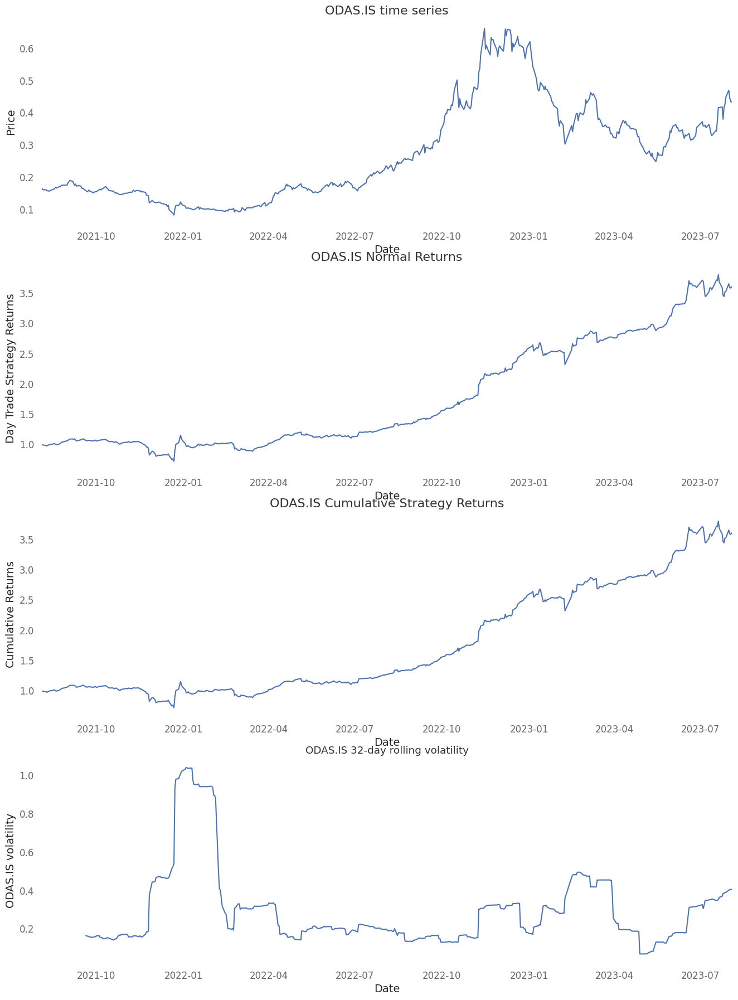

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,90.7%
Cumulative returns,260.9%
Annual volatility,35.8%
Sharpe ratio,1.98
Calmar ratio,2.65
Stability,0.88
Max drawdown,-34.3%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


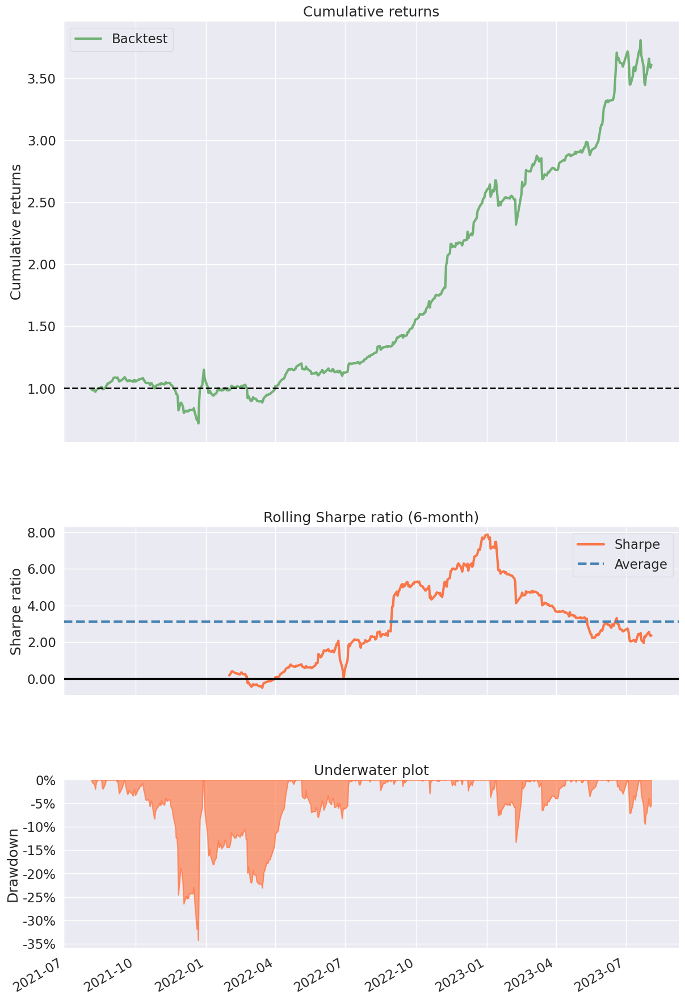

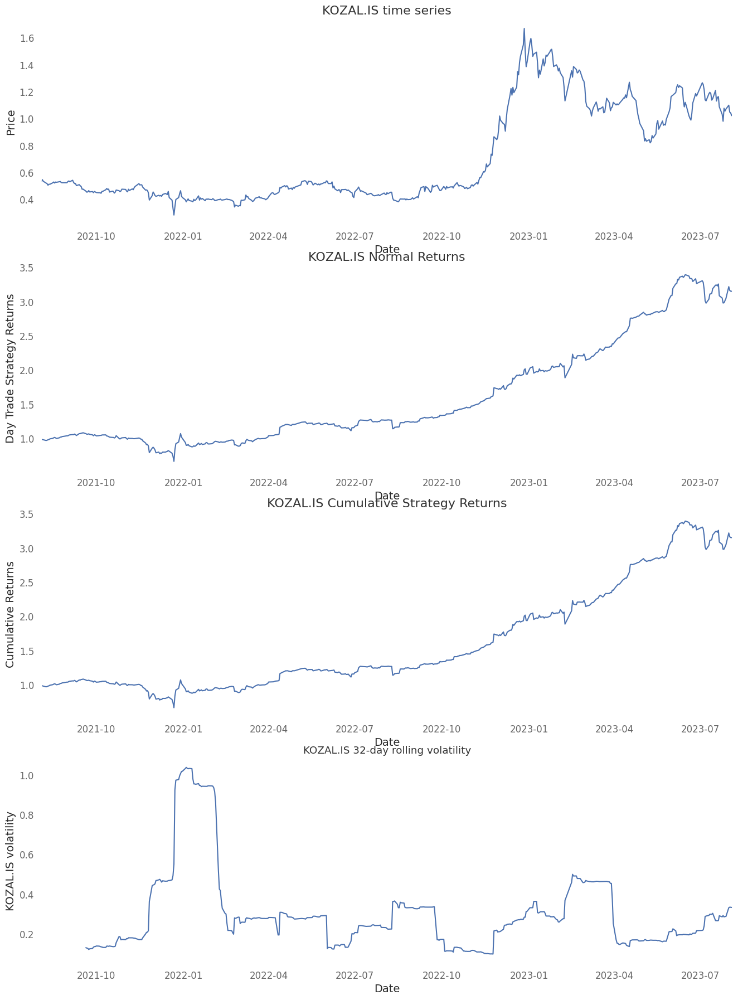

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,78.2%
Cumulative returns,215.5%
Annual volatility,36.2%
Sharpe ratio,1.77
Calmar ratio,2.04
Stability,0.87
Max drawdown,-38.4%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


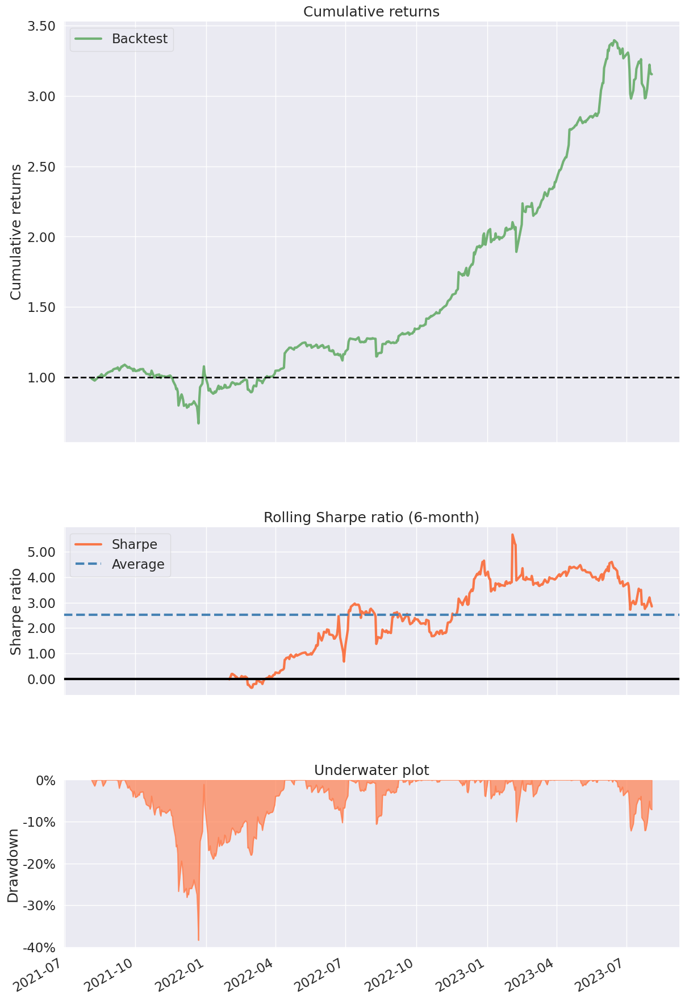

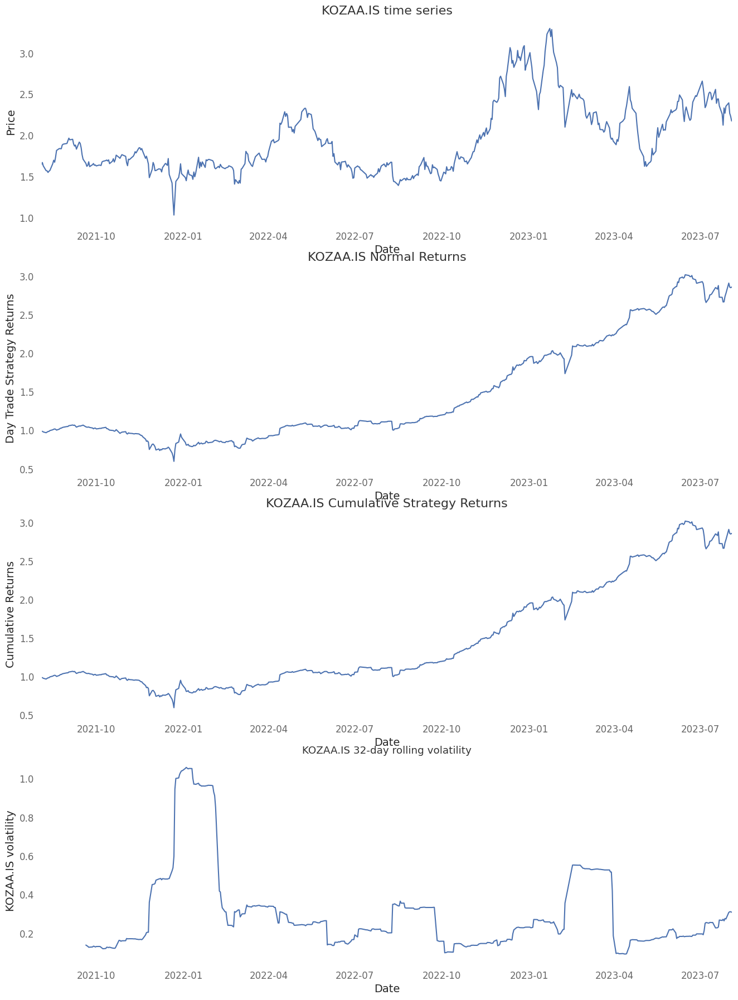

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,69.7%
Cumulative returns,186.0%
Annual volatility,36.7%
Sharpe ratio,1.62
Calmar ratio,1.58
Stability,0.82
Max drawdown,-44.0%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


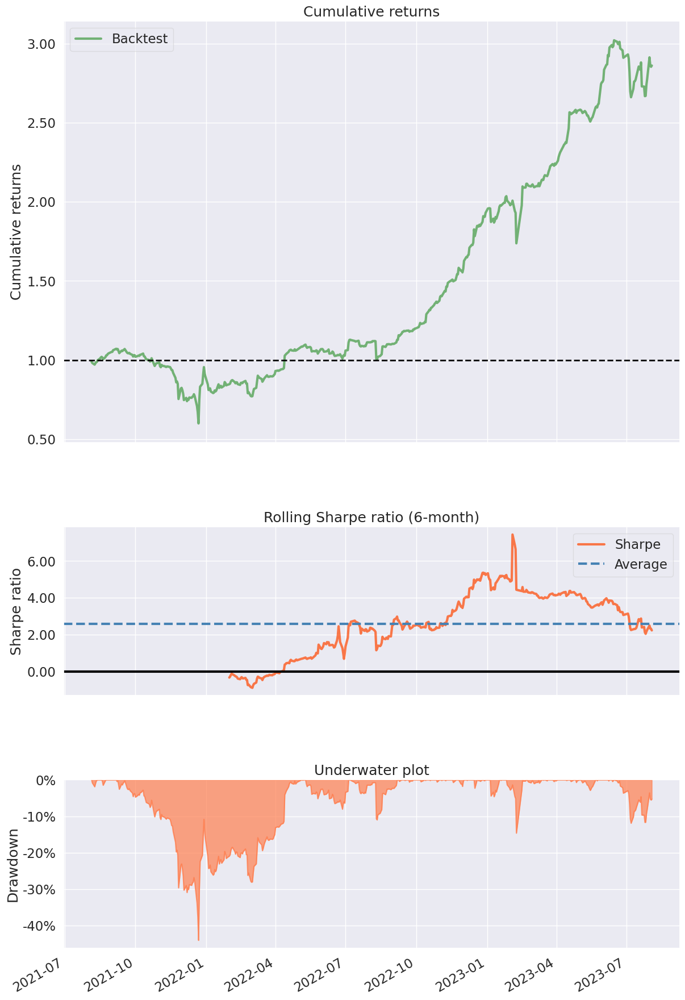

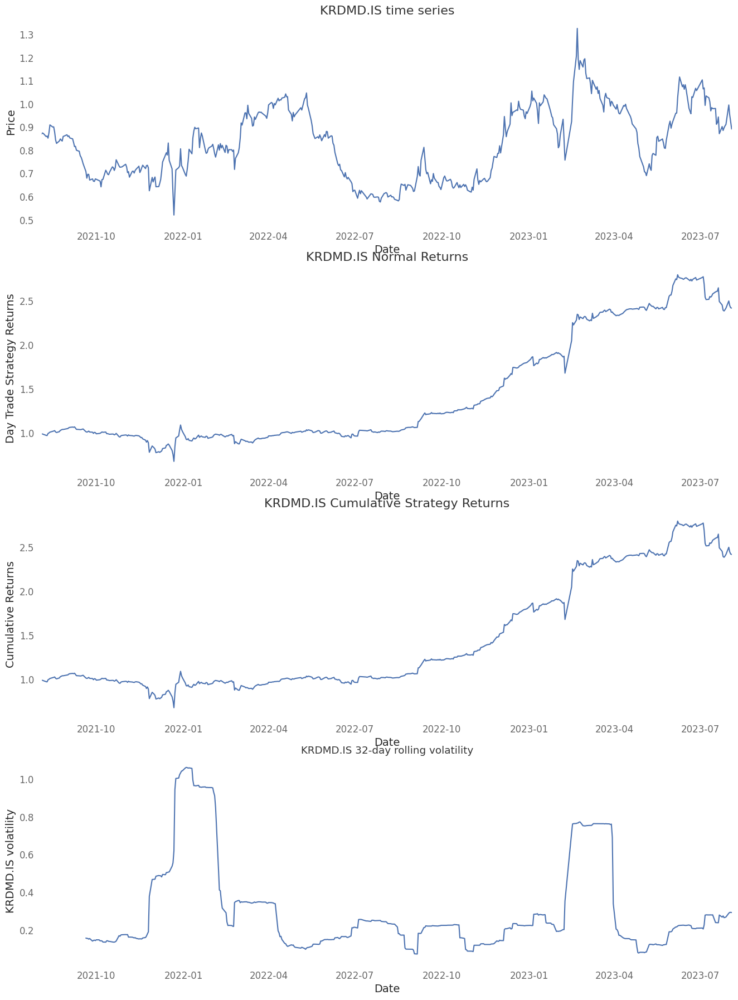

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,56.0%
Cumulative returns,142.0%
Annual volatility,38.3%
Sharpe ratio,1.34
Calmar ratio,1.53
Stability,0.80
Max drawdown,-36.5%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


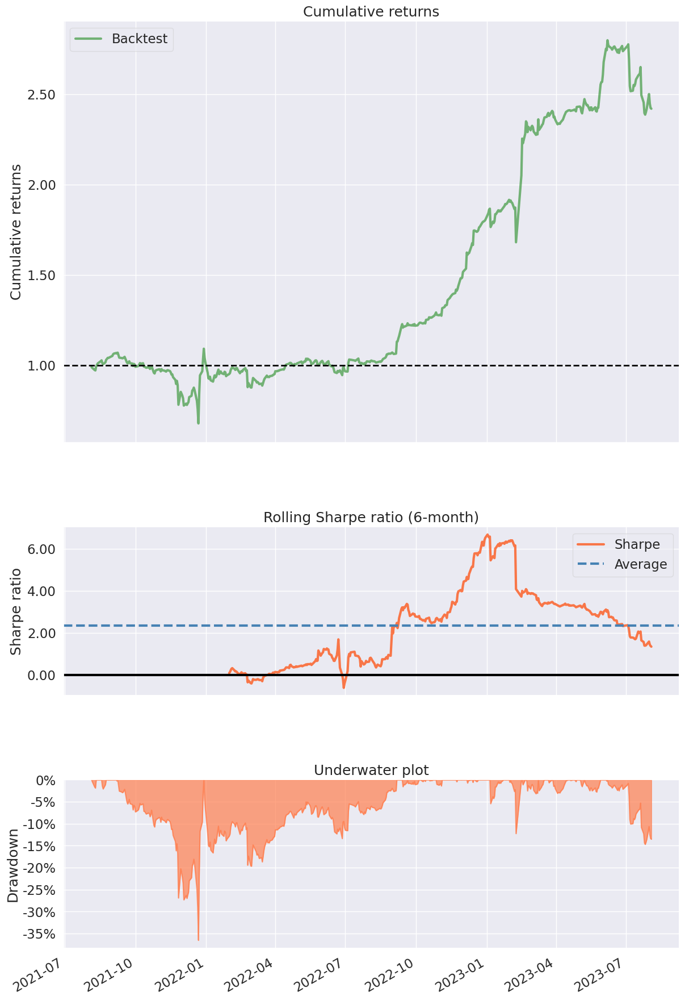

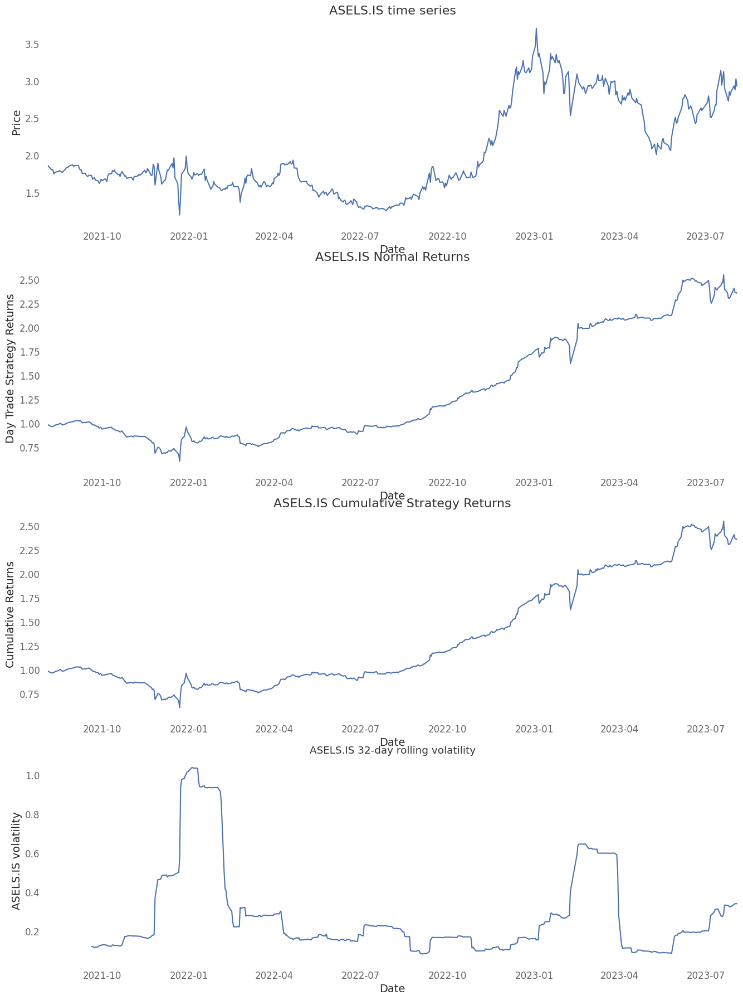

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,54.0%
Cumulative returns,135.9%
Annual volatility,35.7%
Sharpe ratio,1.38
Calmar ratio,1.31
Stability,0.81
Max drawdown,-41.3%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


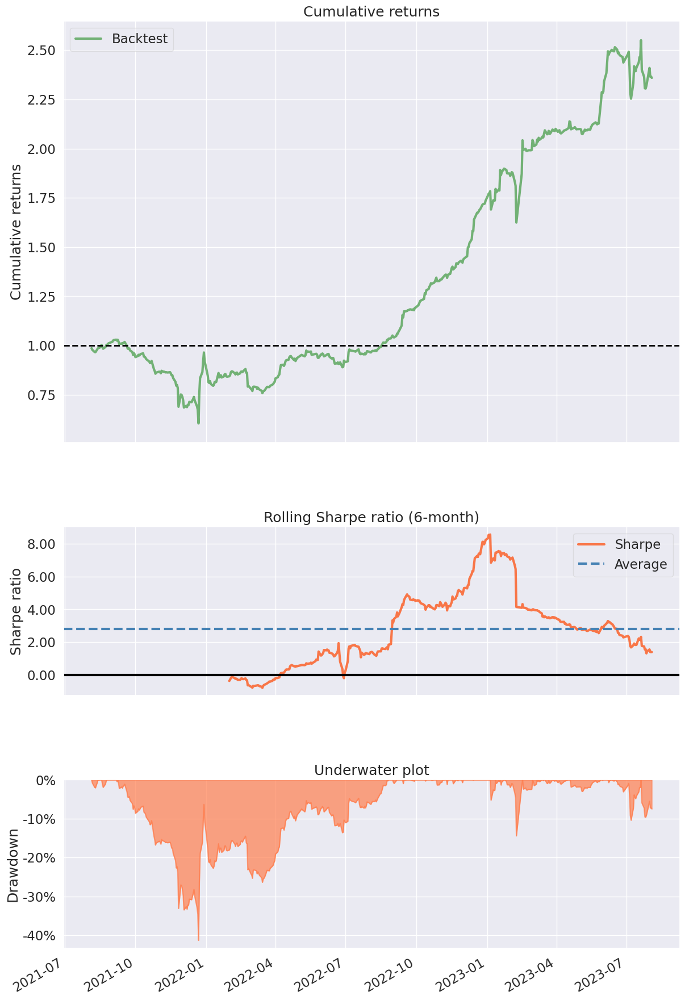

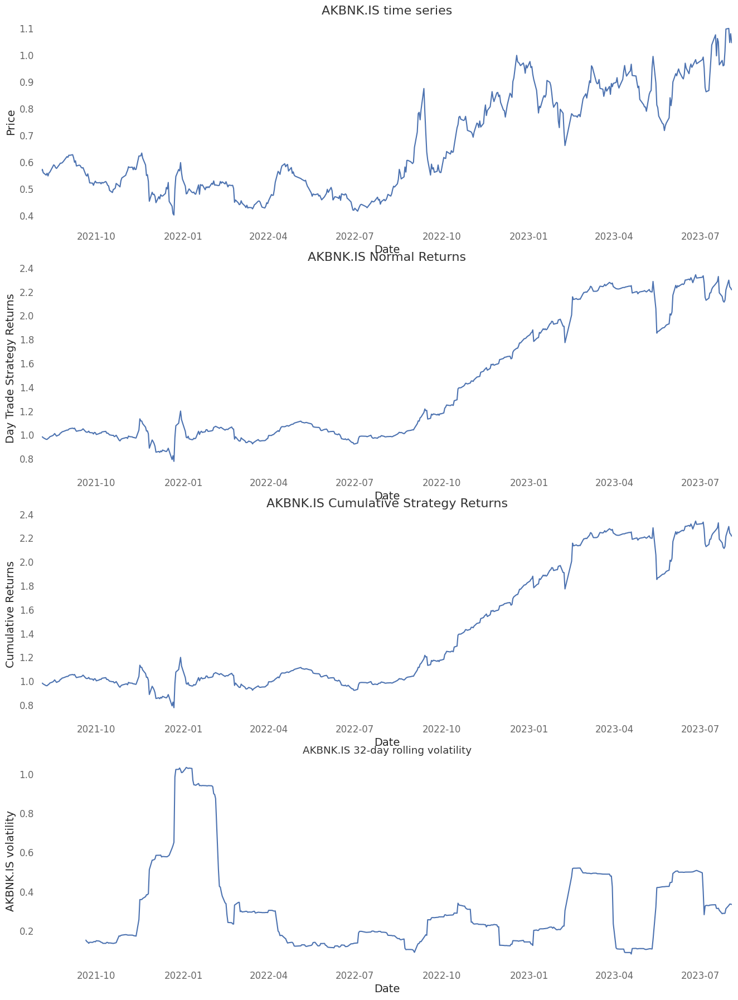

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,49.2%
Cumulative returns,121.7%
Annual volatility,37.6%
Sharpe ratio,1.25
Calmar ratio,1.57
Stability,0.79
Max drawdown,-31.4%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


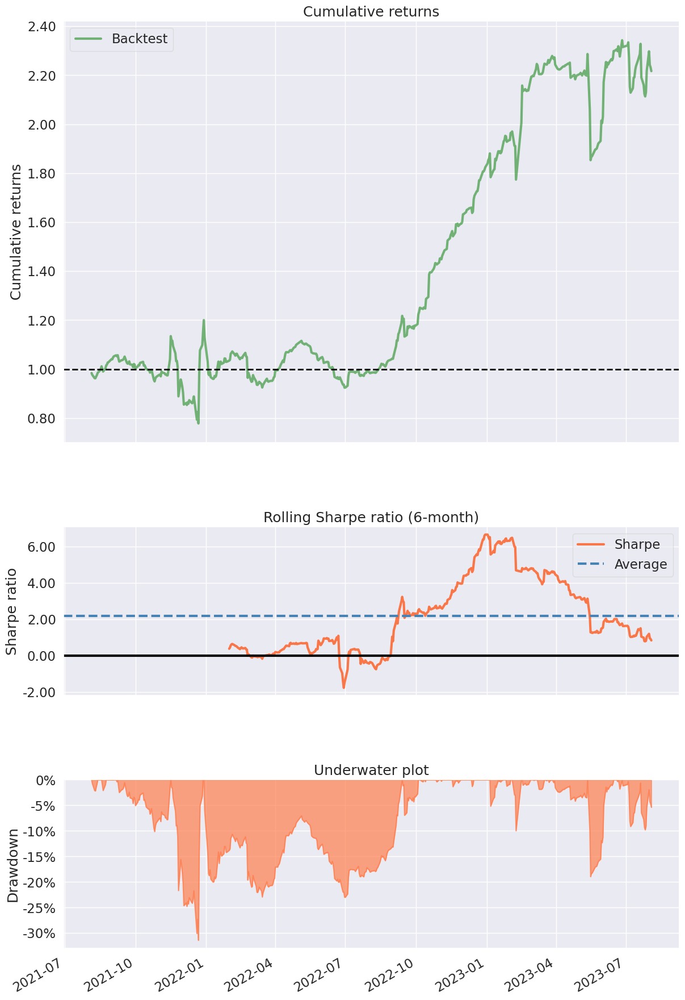

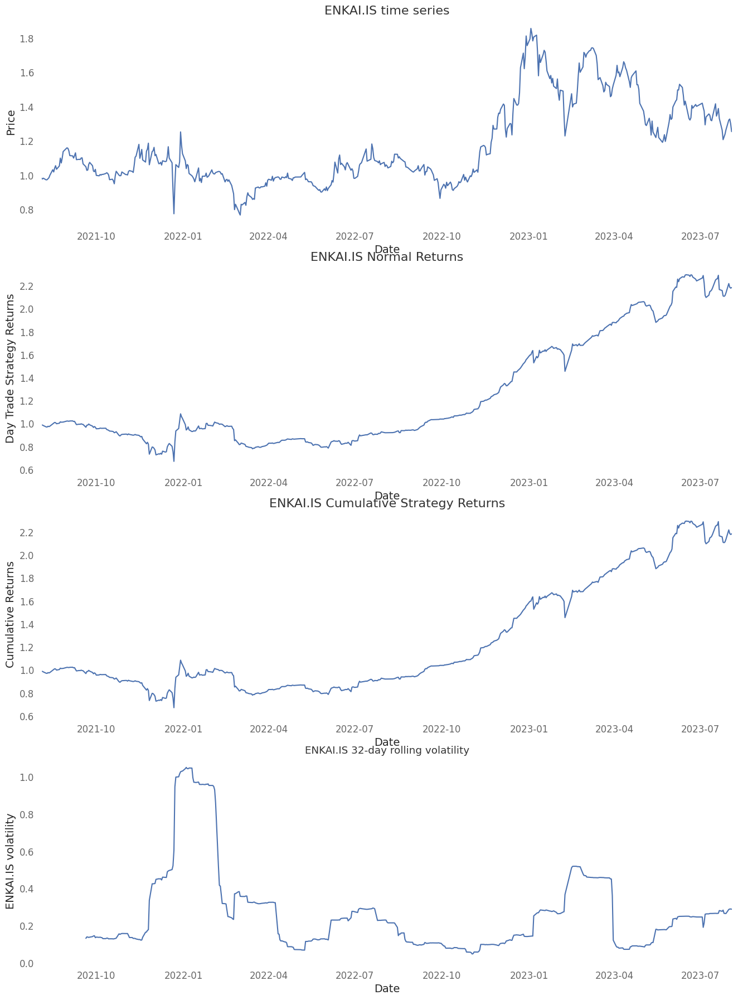

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,48.2%
Cumulative returns,118.6%
Annual volatility,34.8%
Sharpe ratio,1.30
Calmar ratio,1.40
Stability,0.72
Max drawdown,-34.3%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


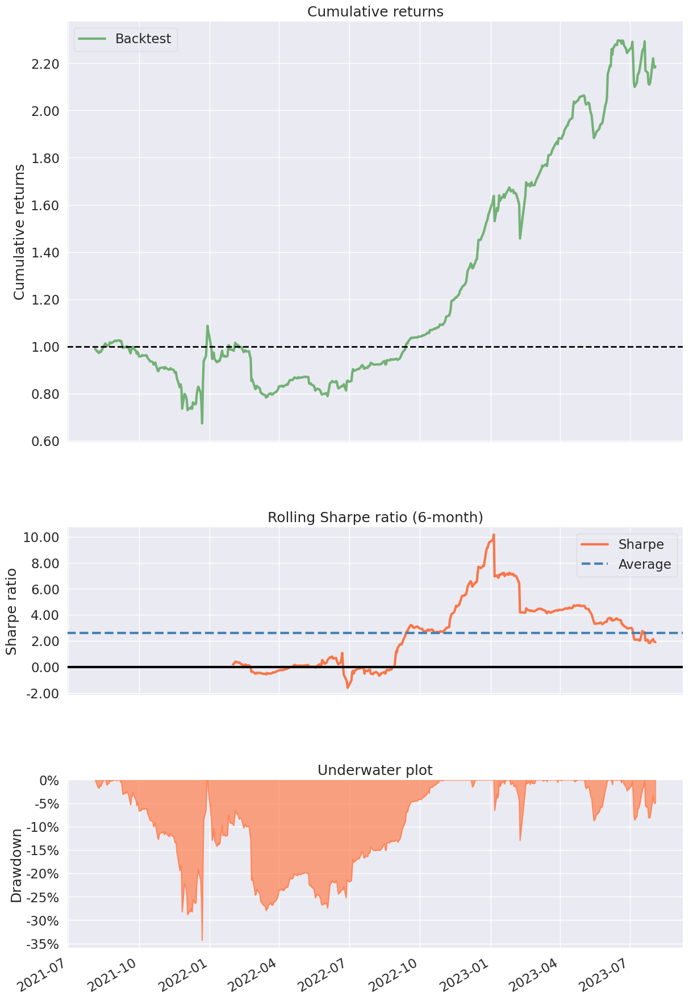

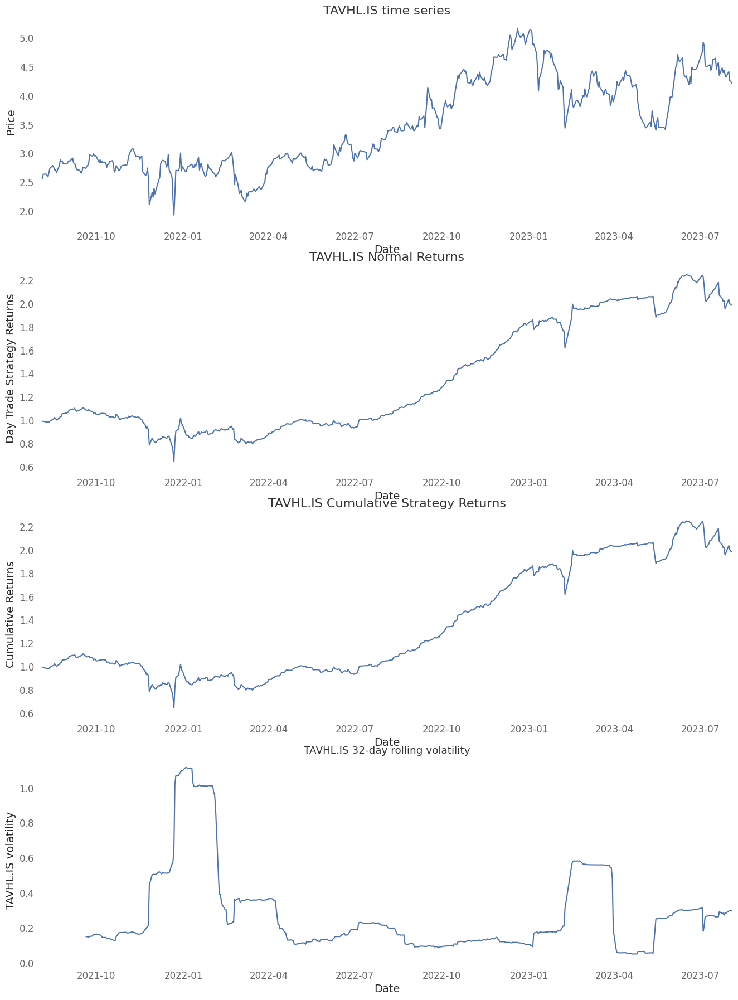

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,41.3%
Cumulative returns,98.8%
Annual volatility,36.6%
Sharpe ratio,1.12
Calmar ratio,0.99
Stability,0.79
Max drawdown,-41.7%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


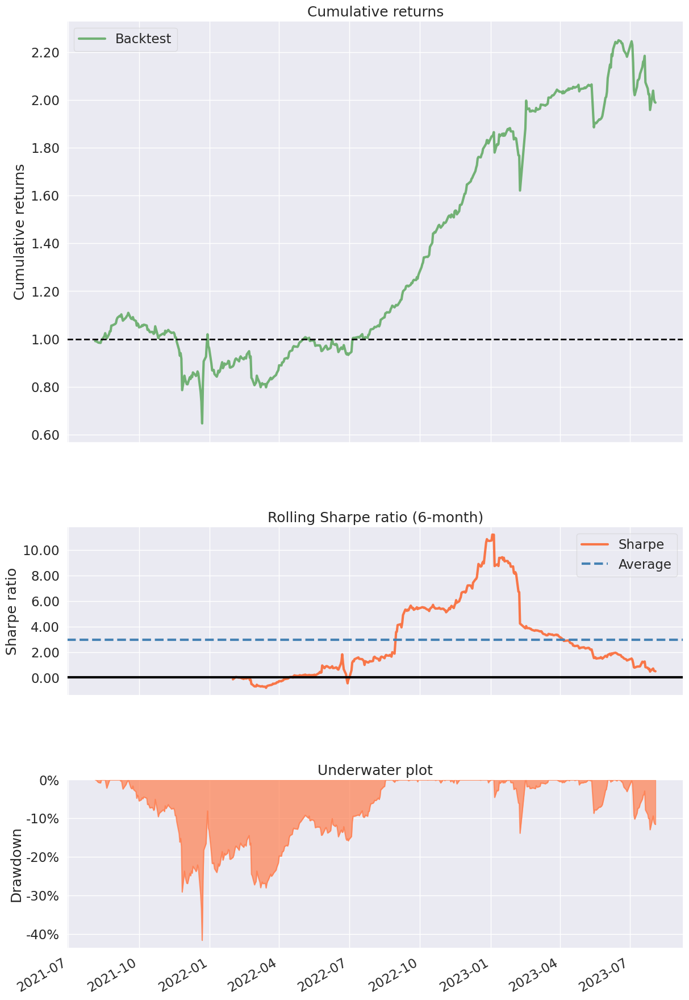

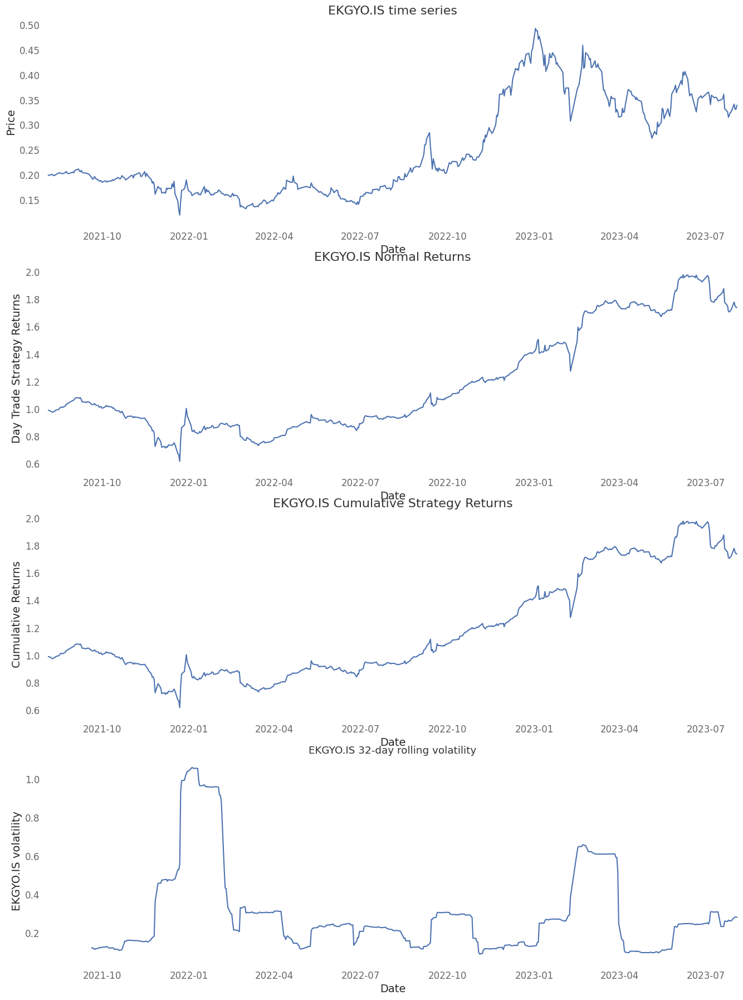

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,32.2%
Cumulative returns,74.1%
Annual volatility,36.9%
Sharpe ratio,0.93
Calmar ratio,0.75
Stability,0.72
Max drawdown,-42.9%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


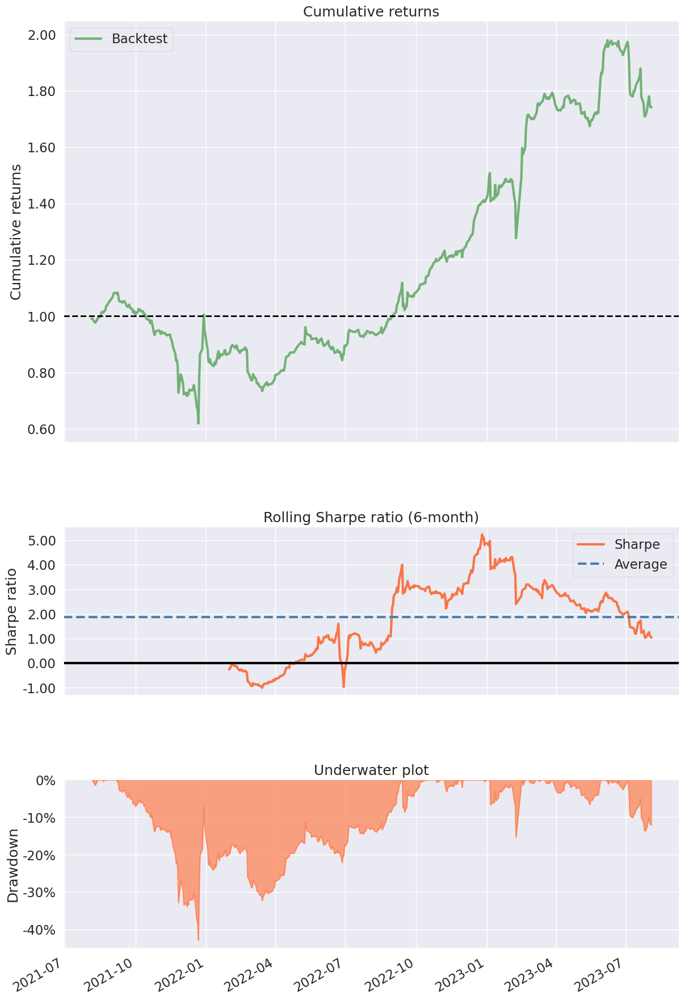

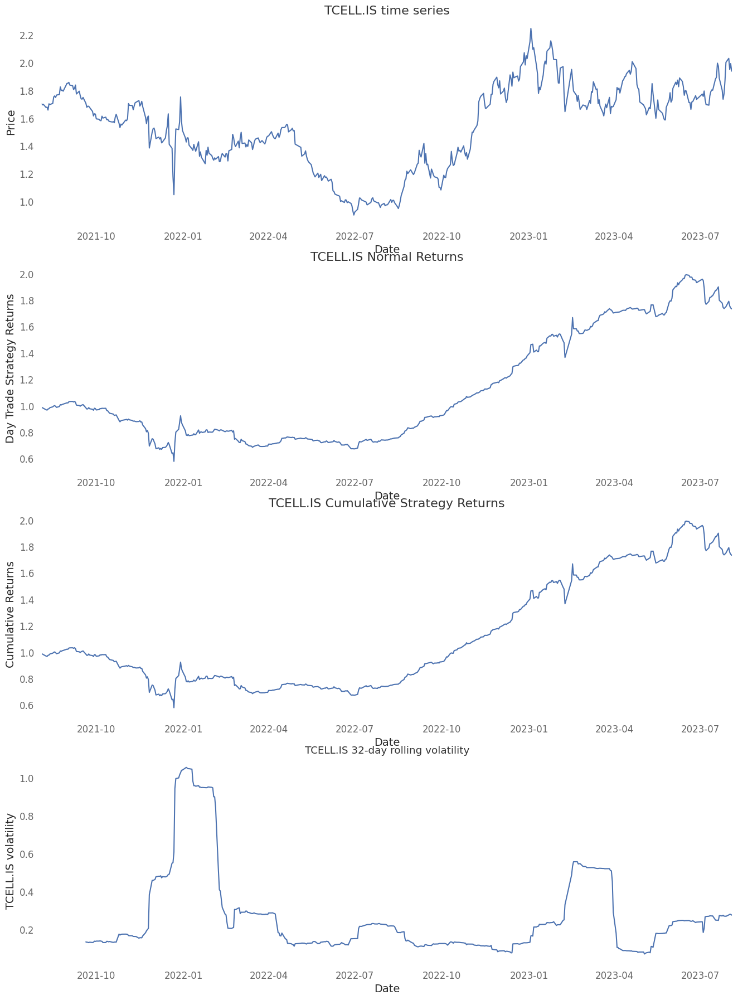

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,32.0%
Cumulative returns,73.6%
Annual volatility,34.6%
Sharpe ratio,0.97
Calmar ratio,0.73
Stability,0.61
Max drawdown,-43.8%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


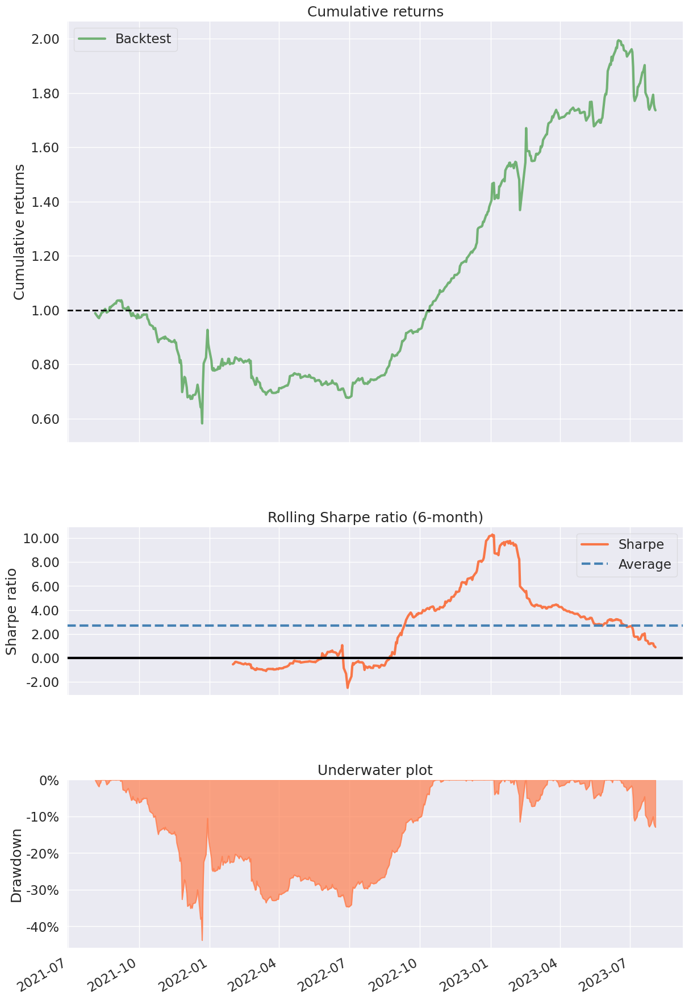

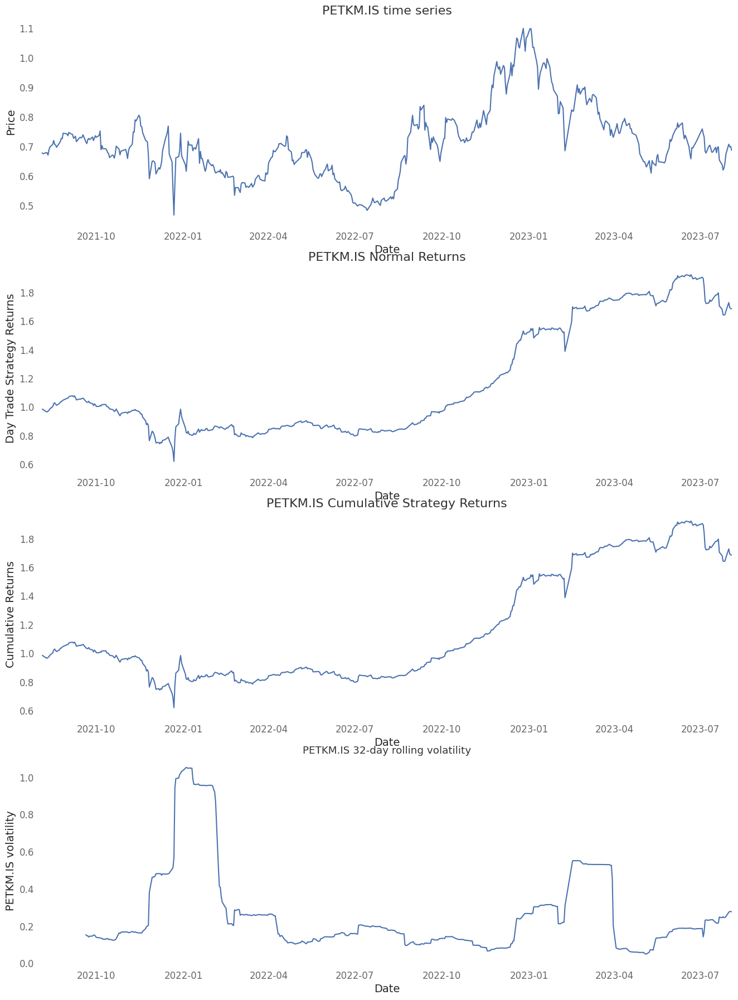

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,30.1%
Cumulative returns,68.6%
Annual volatility,34.4%
Sharpe ratio,0.93
Calmar ratio,0.71
Stability,0.64
Max drawdown,-42.4%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


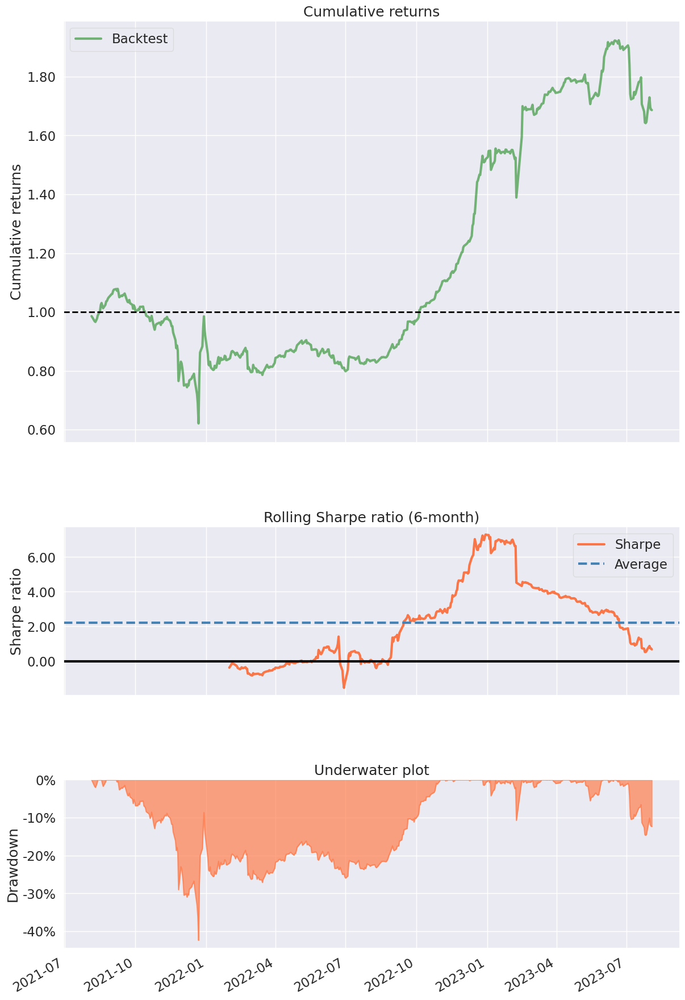

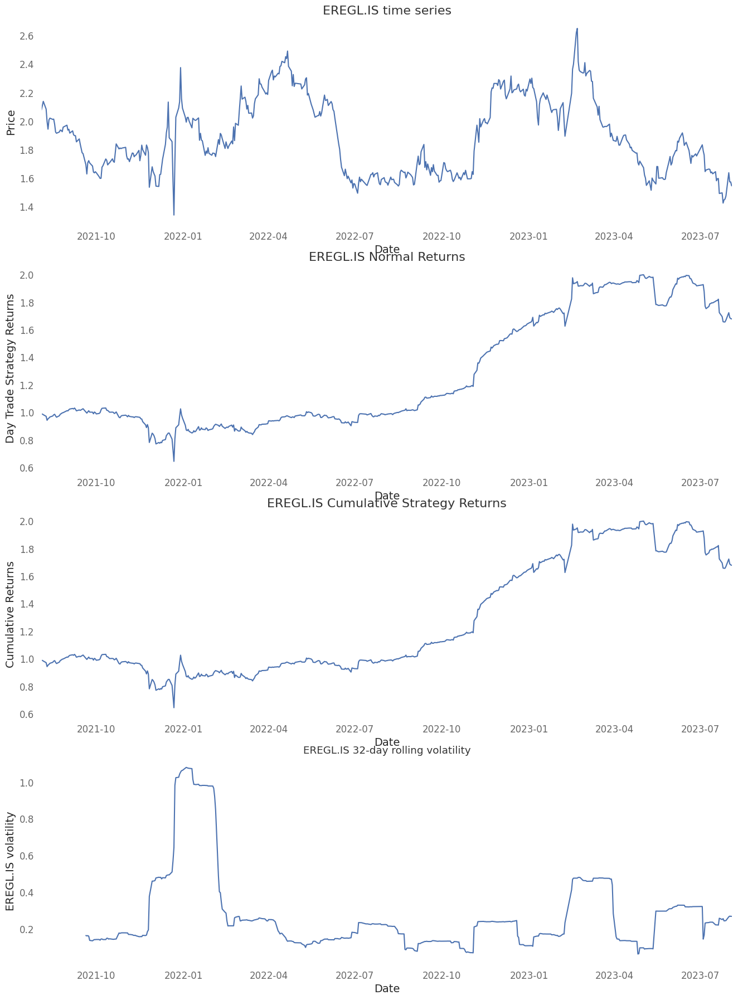

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,29.8%
Cumulative returns,68.0%
Annual volatility,35.0%
Sharpe ratio,0.92
Calmar ratio,0.79
Stability,0.77
Max drawdown,-37.5%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

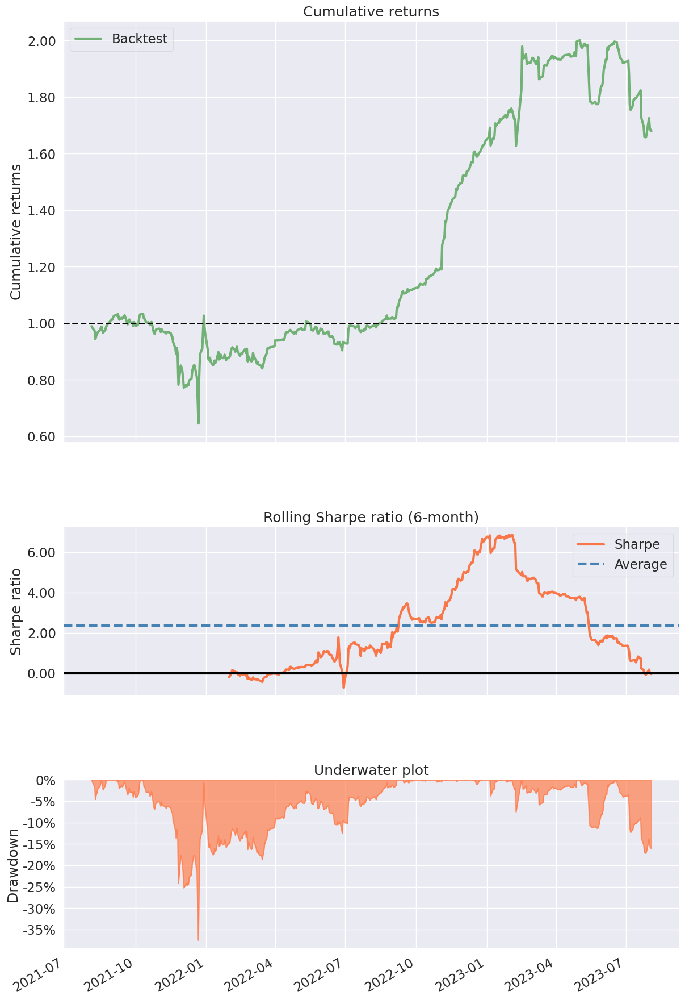

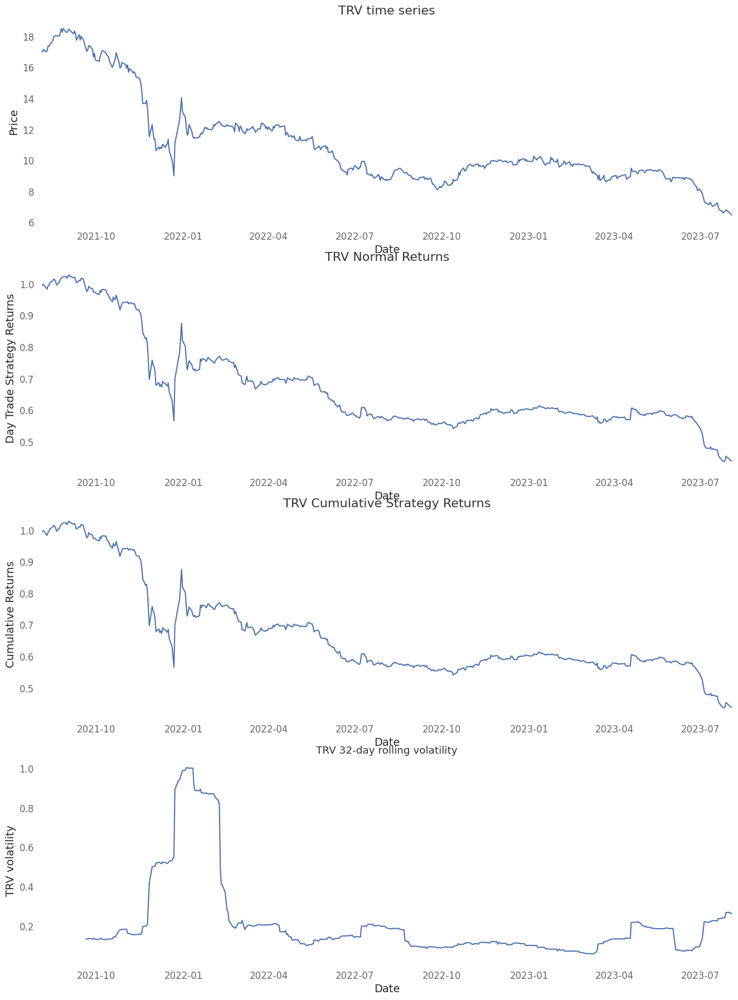

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,-33.8%
Cumulative returns,-56.0%
Annual volatility,29.5%
Sharpe ratio,-1.25
Calmar ratio,-0.59
Stability,0.75
Max drawdown,-57.4%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


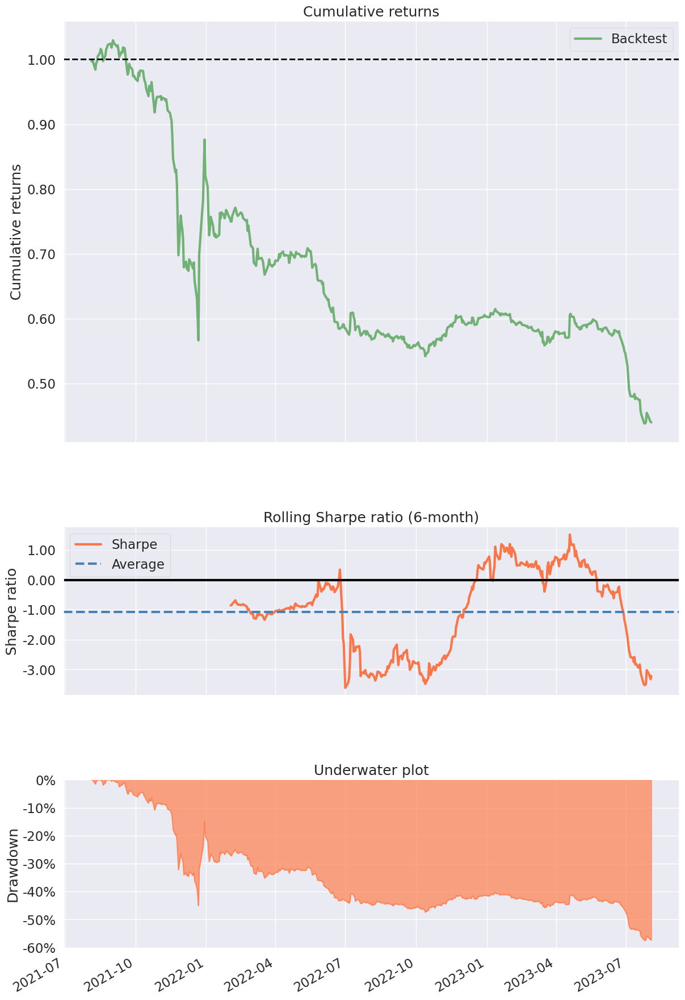

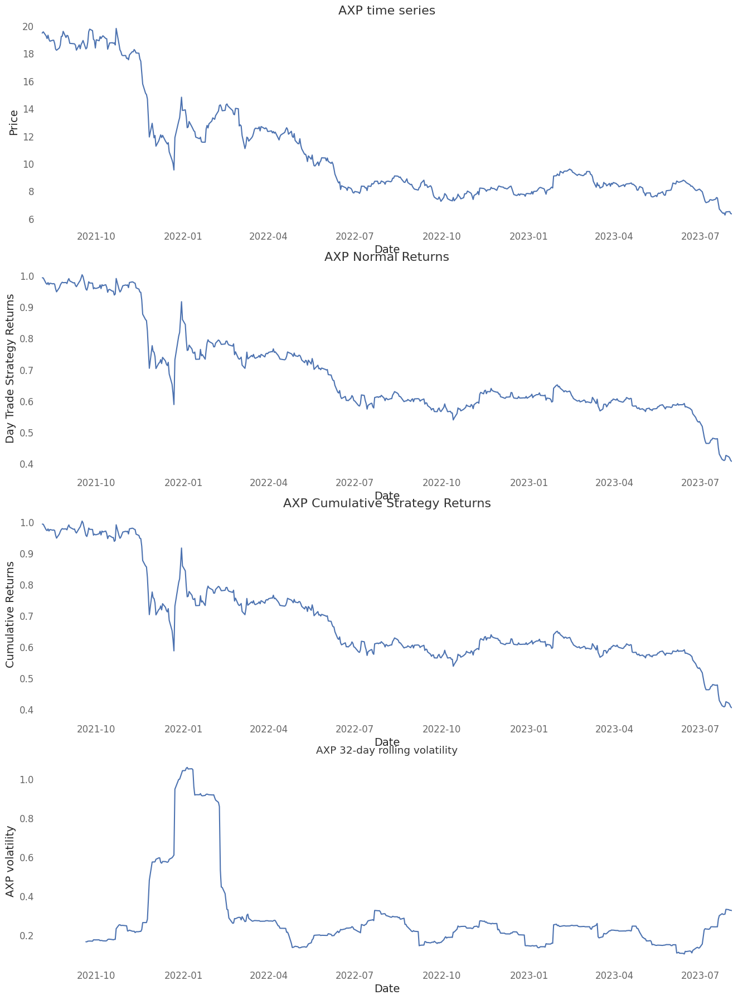

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,-36.3%
Cumulative returns,-59.3%
Annual volatility,34.6%
Sharpe ratio,-1.14
Calmar ratio,-0.61
Stability,0.80
Max drawdown,-59.5%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


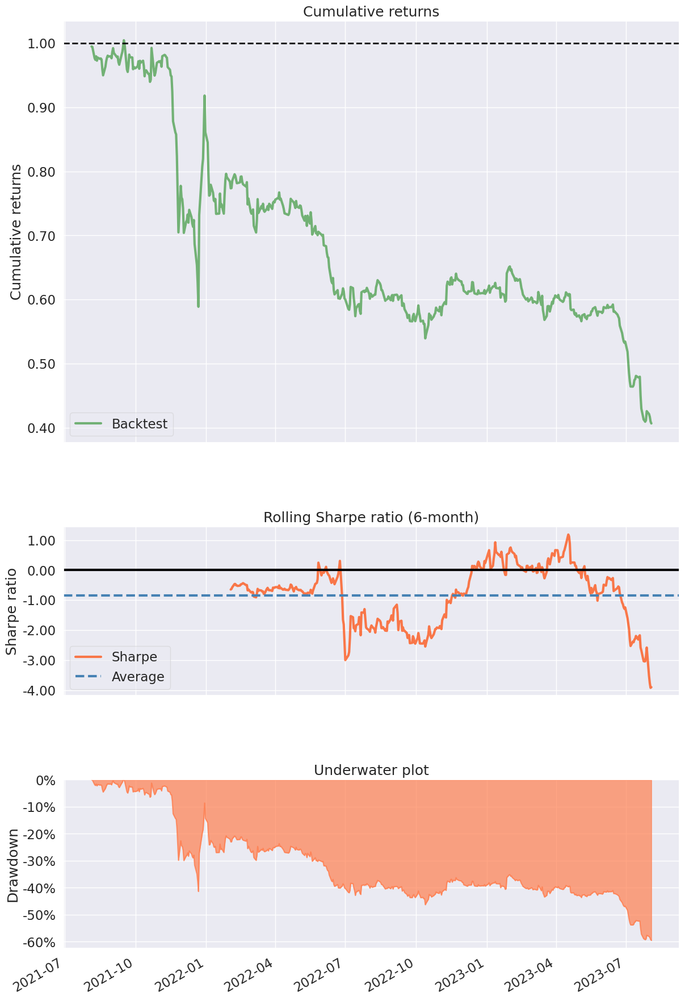

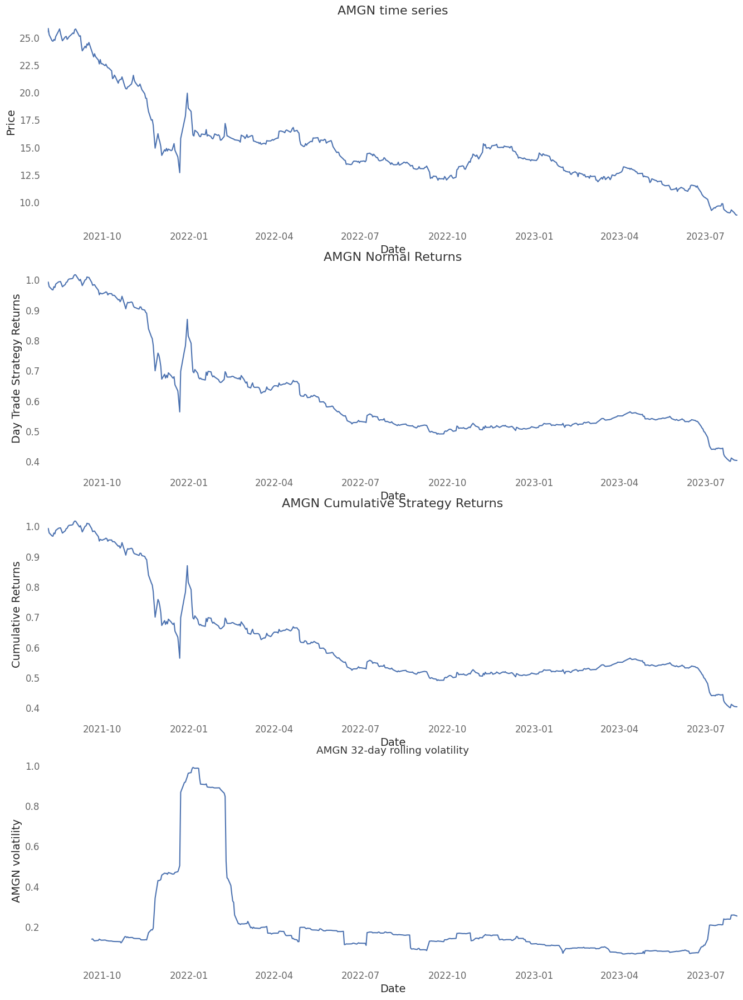

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,-36.5%
Cumulative returns,-59.6%
Annual volatility,28.9%
Sharpe ratio,-1.43
Calmar ratio,-0.60
Stability,0.74
Max drawdown,-60.6%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


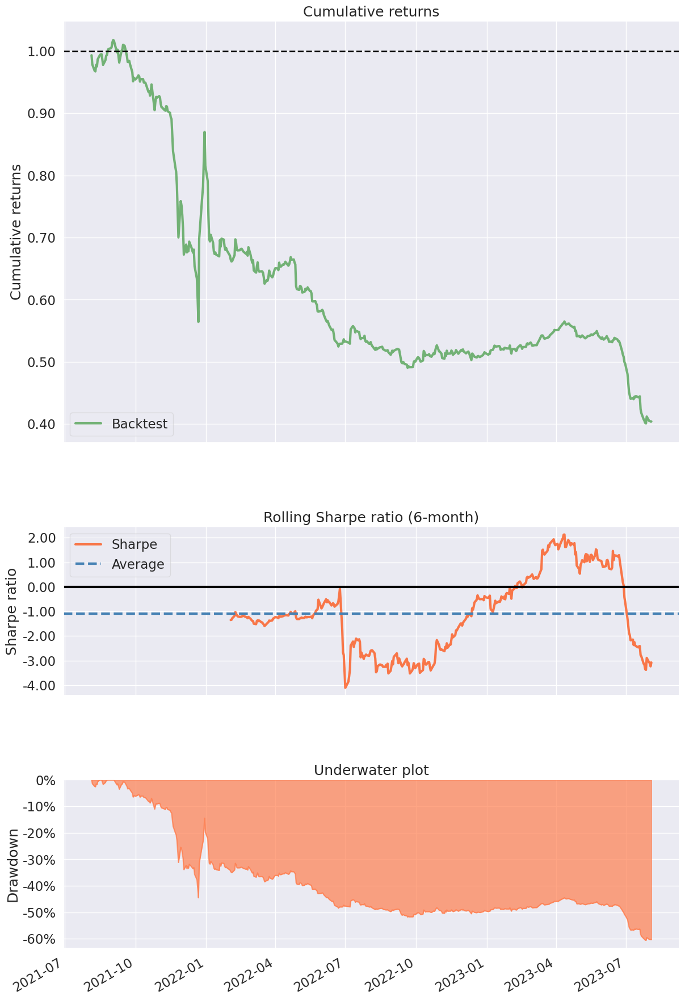

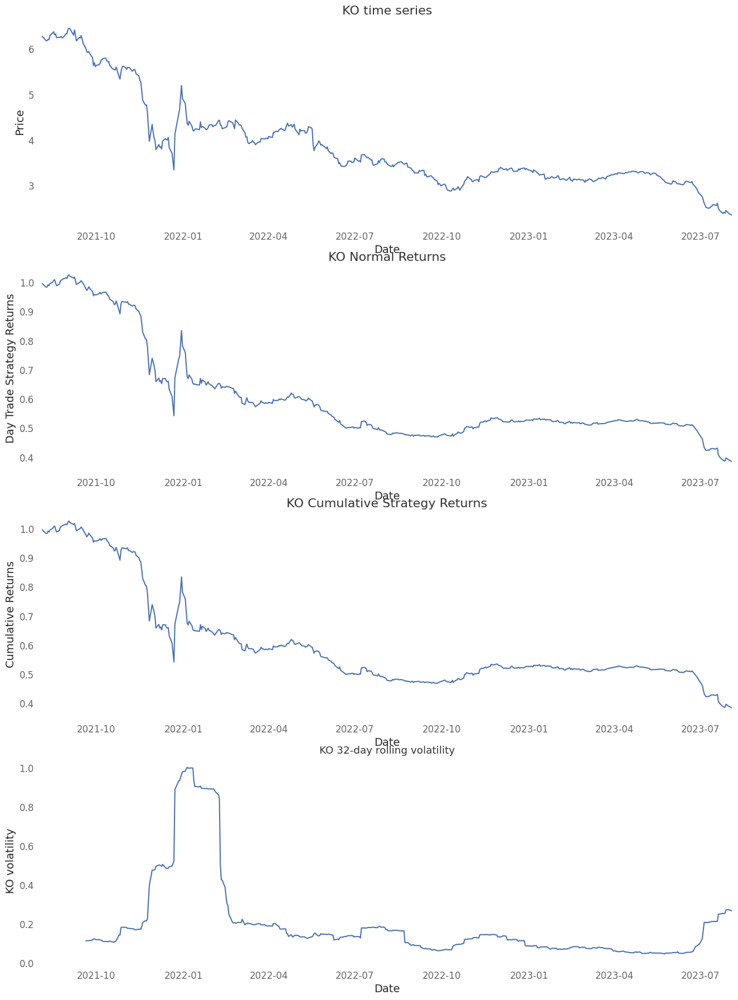

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,-38.0%
Cumulative returns,-61.4%
Annual volatility,28.9%
Sharpe ratio,-1.51
Calmar ratio,-0.61
Stability,0.69
Max drawdown,-62.4%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


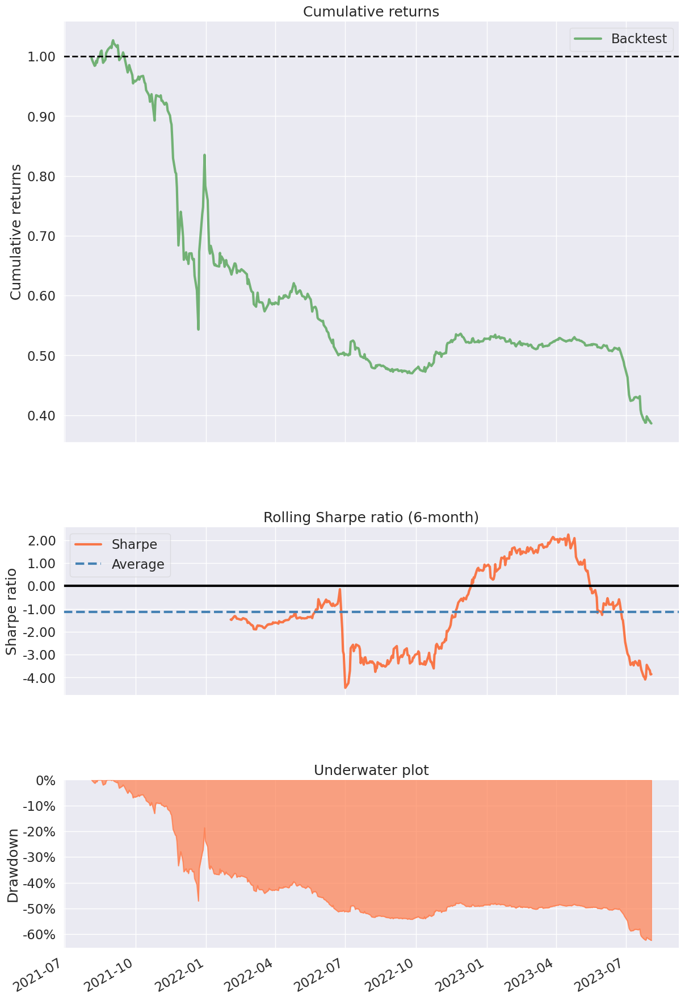

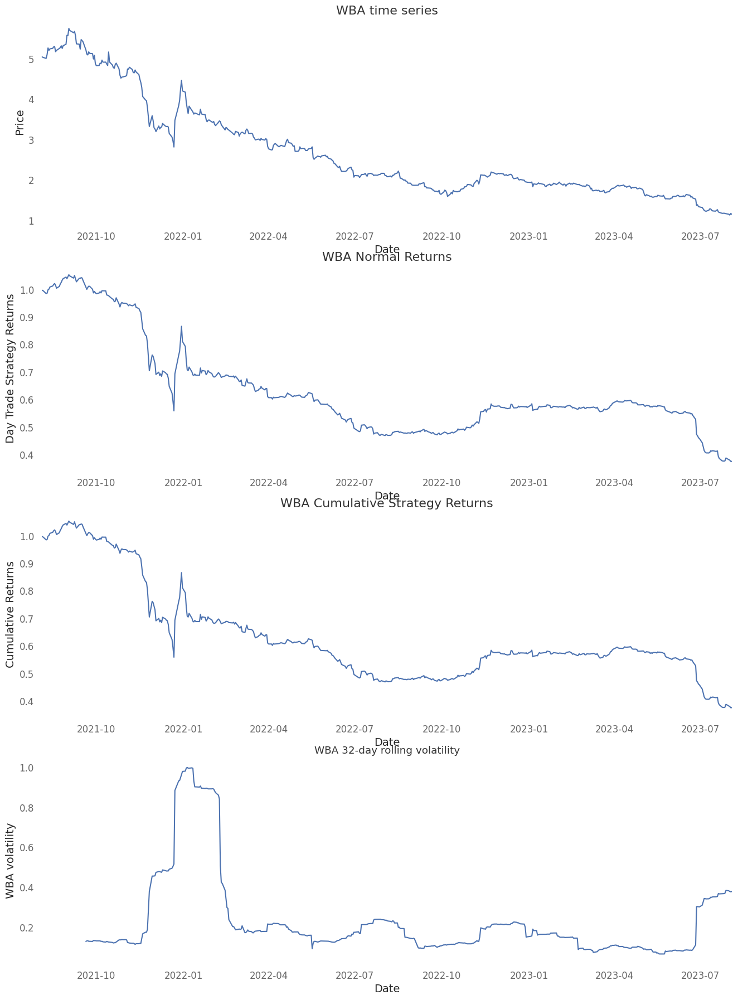

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,-38.7%
Cumulative returns,-62.3%
Annual volatility,30.8%
Sharpe ratio,-1.44
Calmar ratio,-0.60
Stability,0.61
Max drawdown,-64.3%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


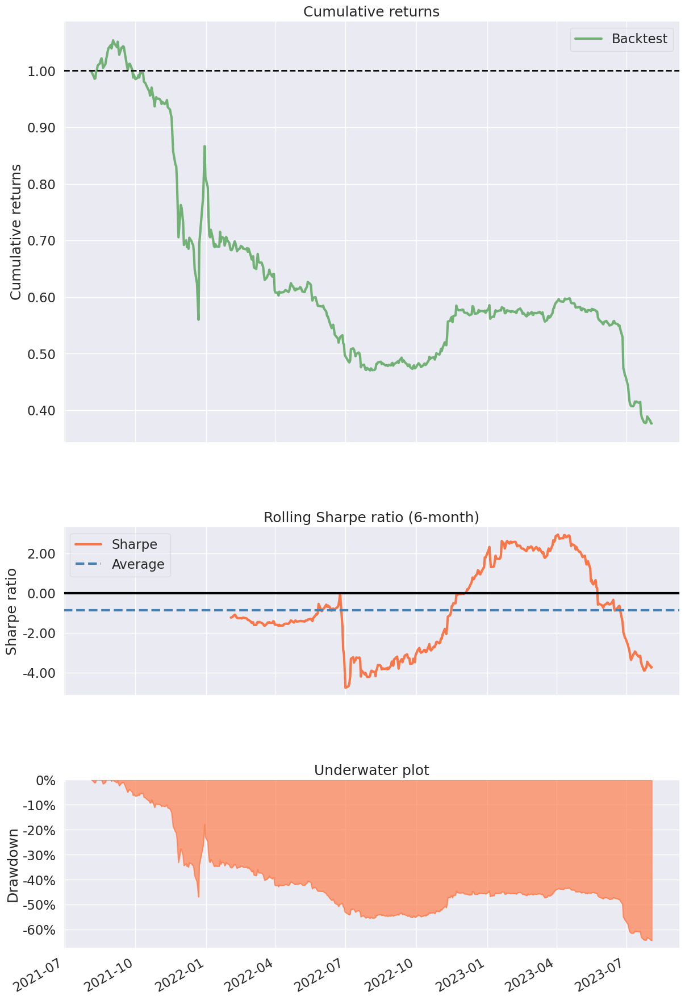

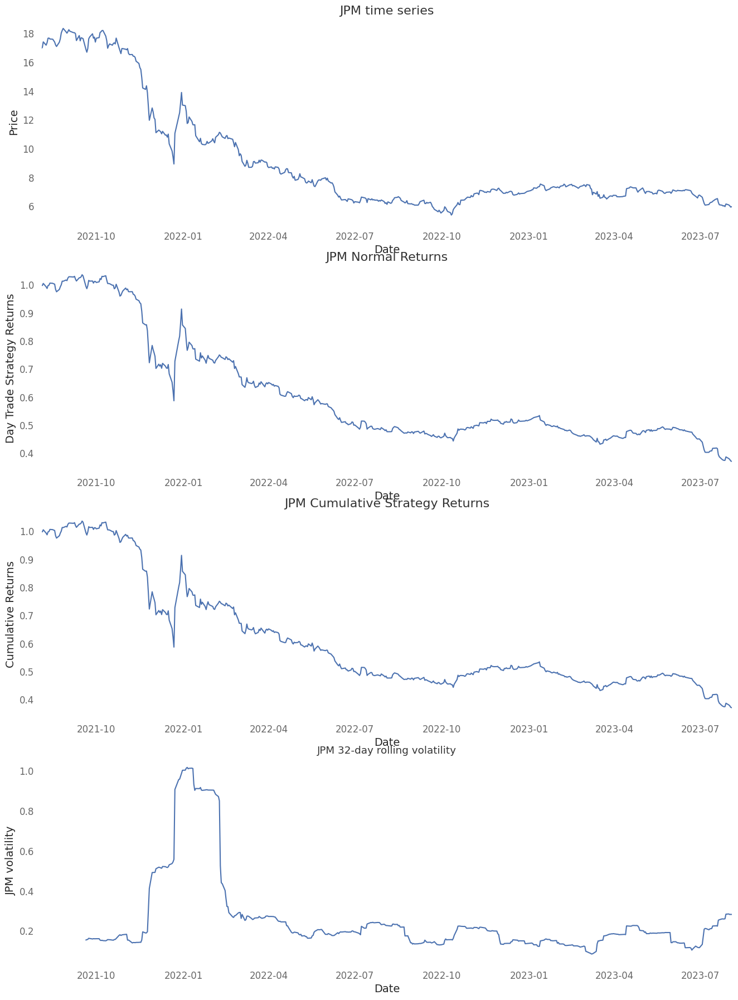

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,-39.2%
Cumulative returns,-62.9%
Annual volatility,31.8%
Sharpe ratio,-1.41
Calmar ratio,-0.61
Stability,0.82
Max drawdown,-64.2%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


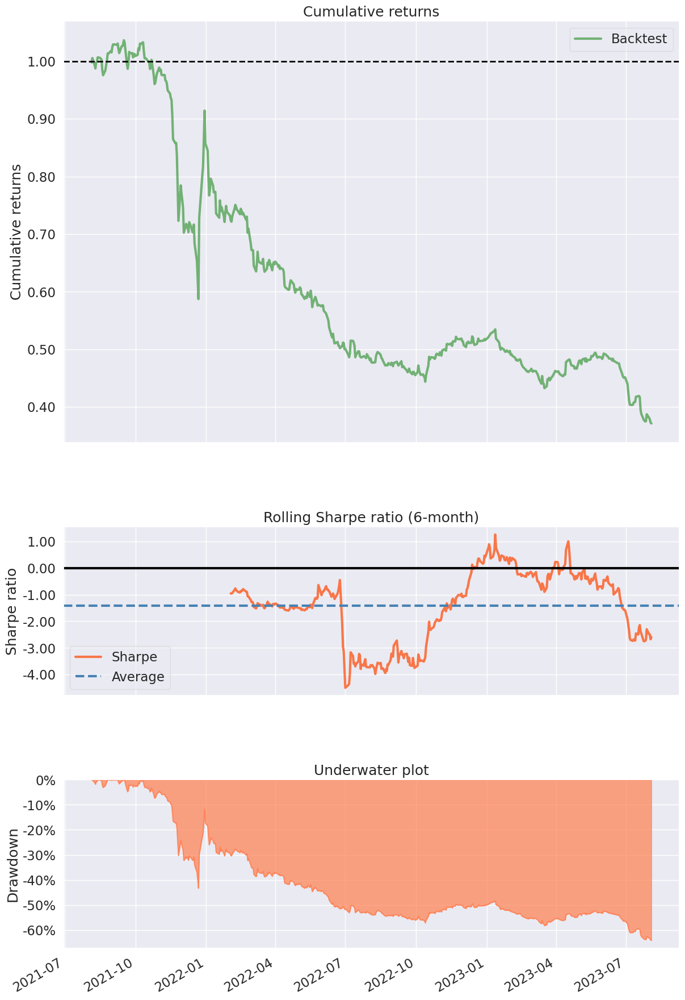

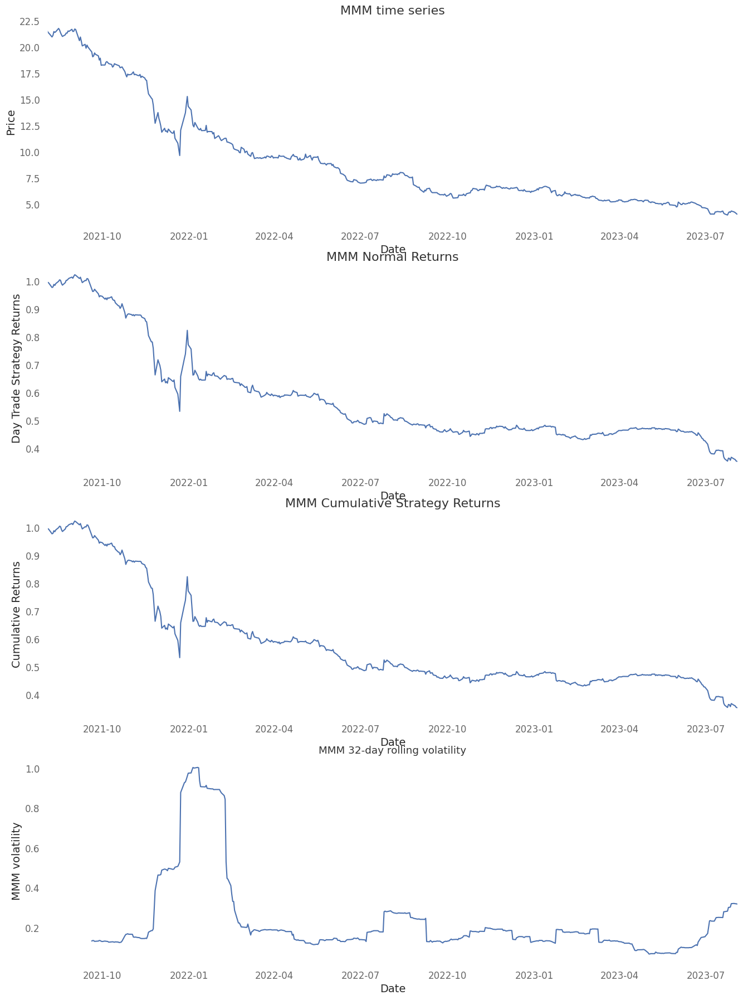

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,-40.6%
Cumulative returns,-64.6%
Annual volatility,30.6%
Sharpe ratio,-1.56
Calmar ratio,-0.62
Stability,0.83
Max drawdown,-65.5%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


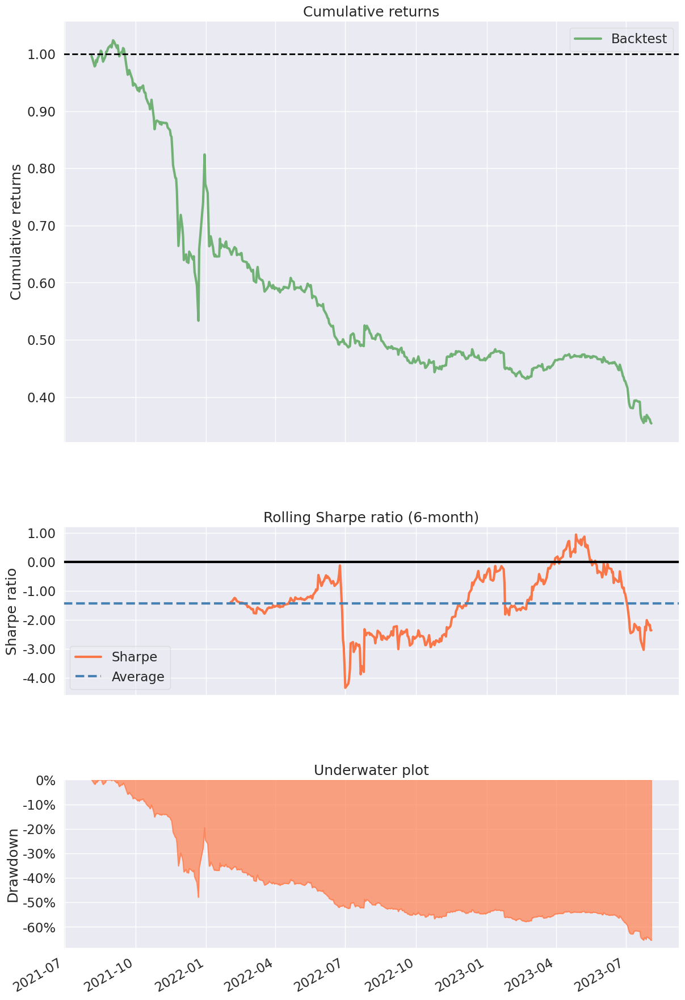

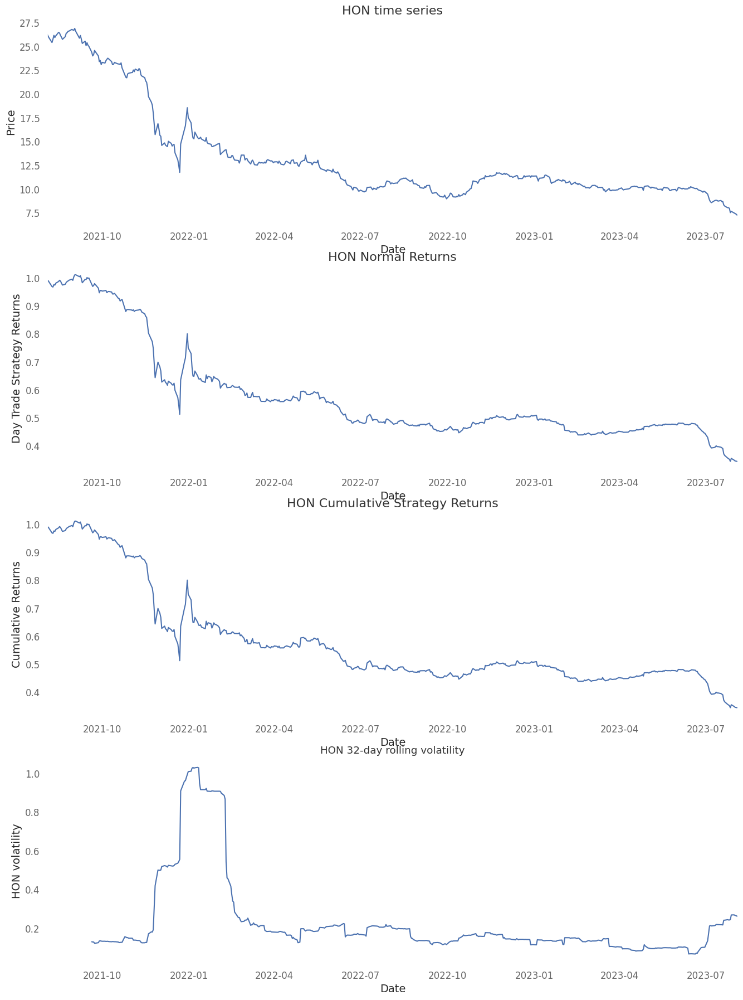

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,-41.4%
Cumulative returns,-65.5%
Annual volatility,30.7%
Sharpe ratio,-1.59
Calmar ratio,-0.63
Stability,0.78
Max drawdown,-66.0%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


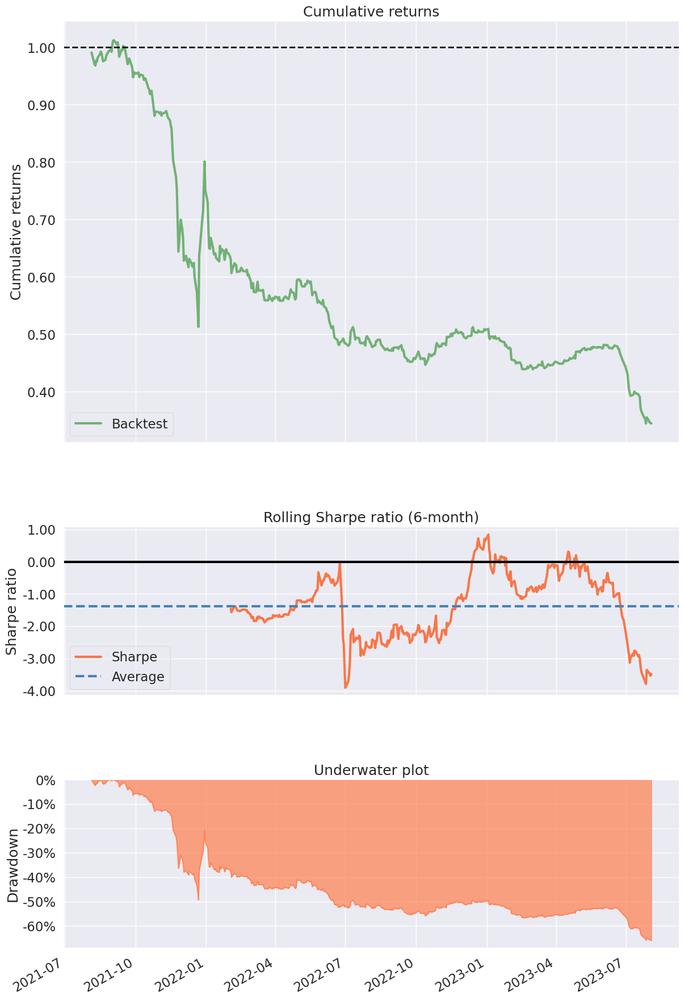

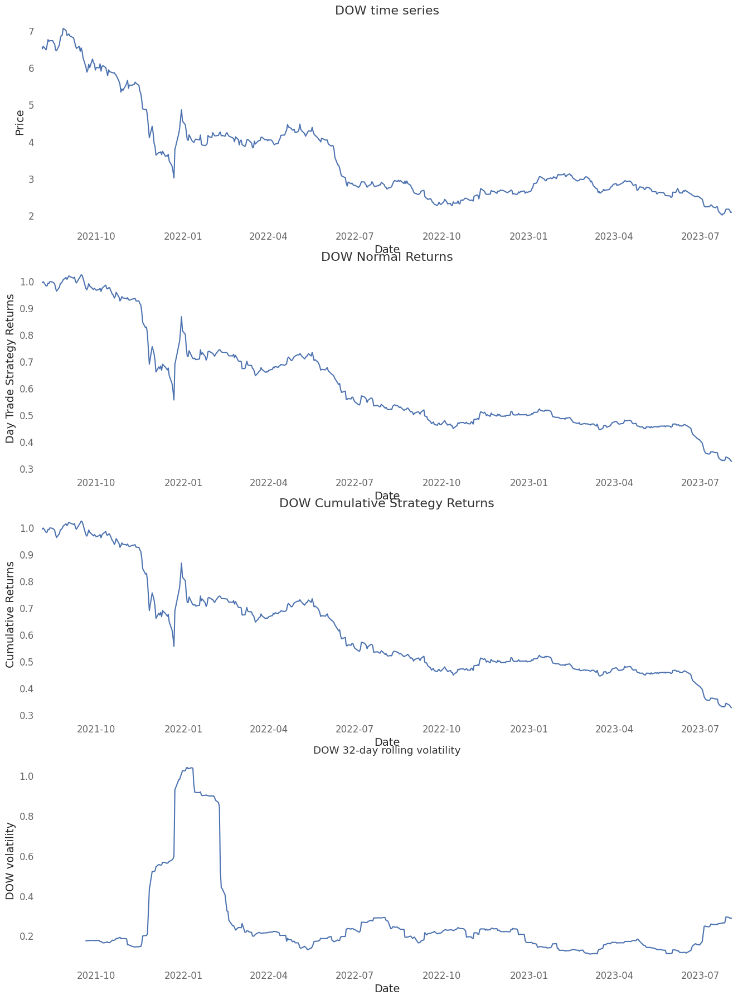

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,-42.8%
Cumulative returns,-67.2%
Annual volatility,32.6%
Sharpe ratio,-1.55
Calmar ratio,-0.63
Stability,0.89
Max drawdown,-68.0%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


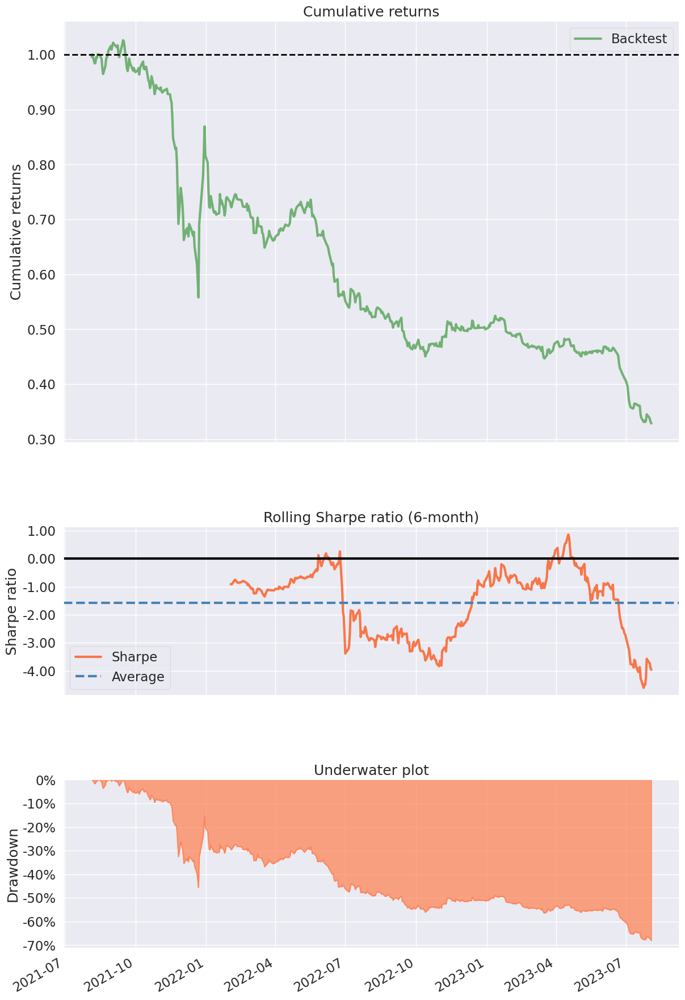

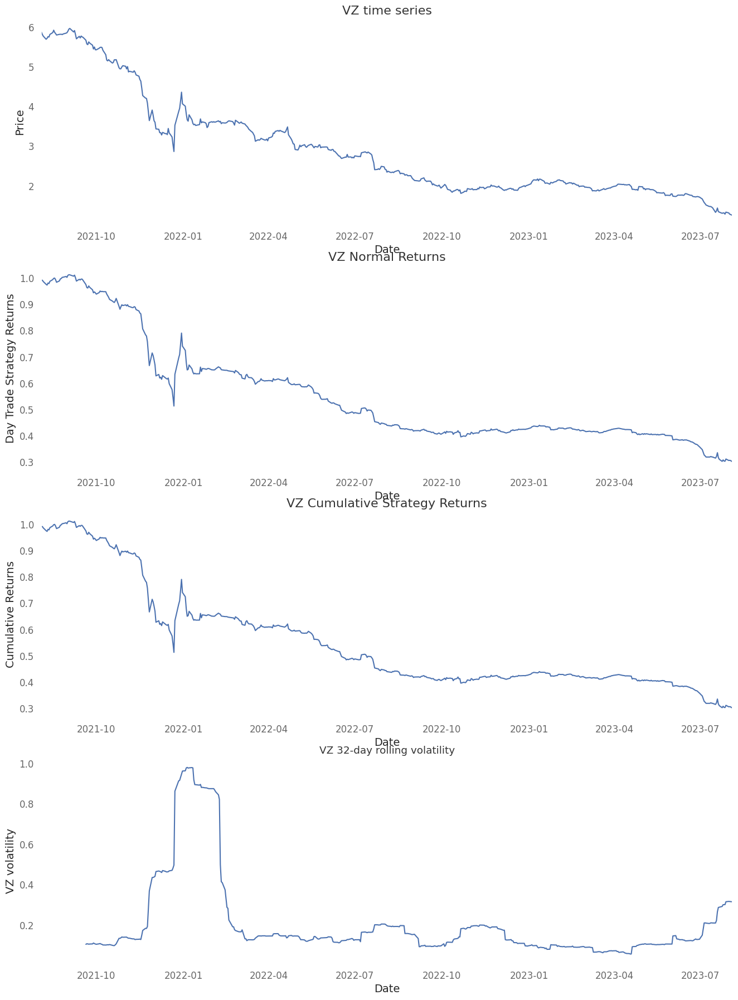

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,-45.1%
Cumulative returns,-69.7%
Annual volatility,28.9%
Sharpe ratio,-1.93
Calmar ratio,-0.64
Stability,0.87
Max drawdown,-70.0%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


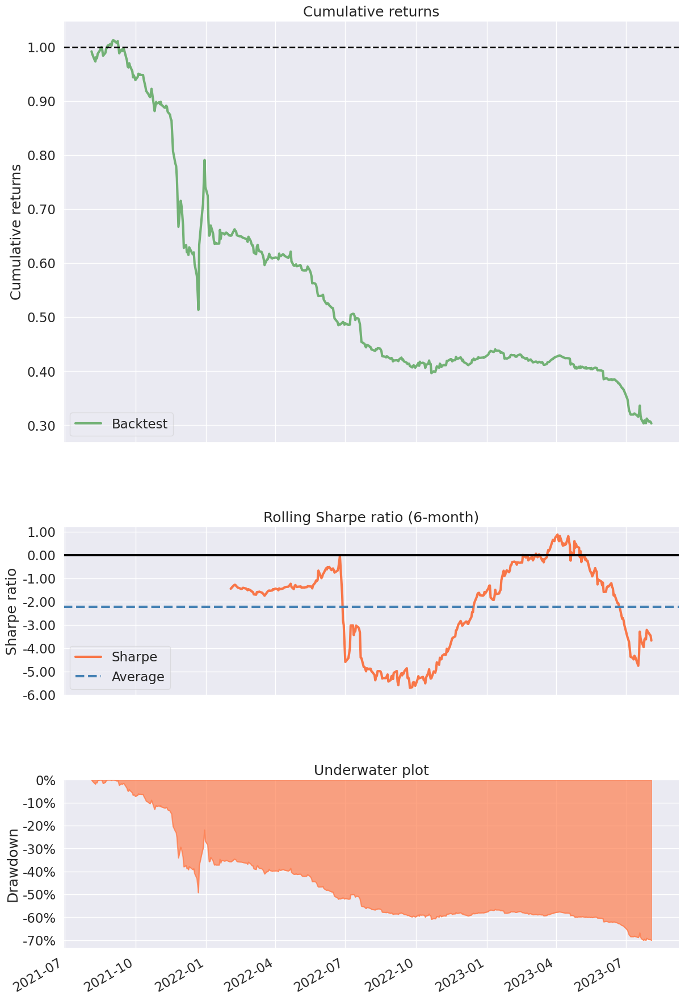

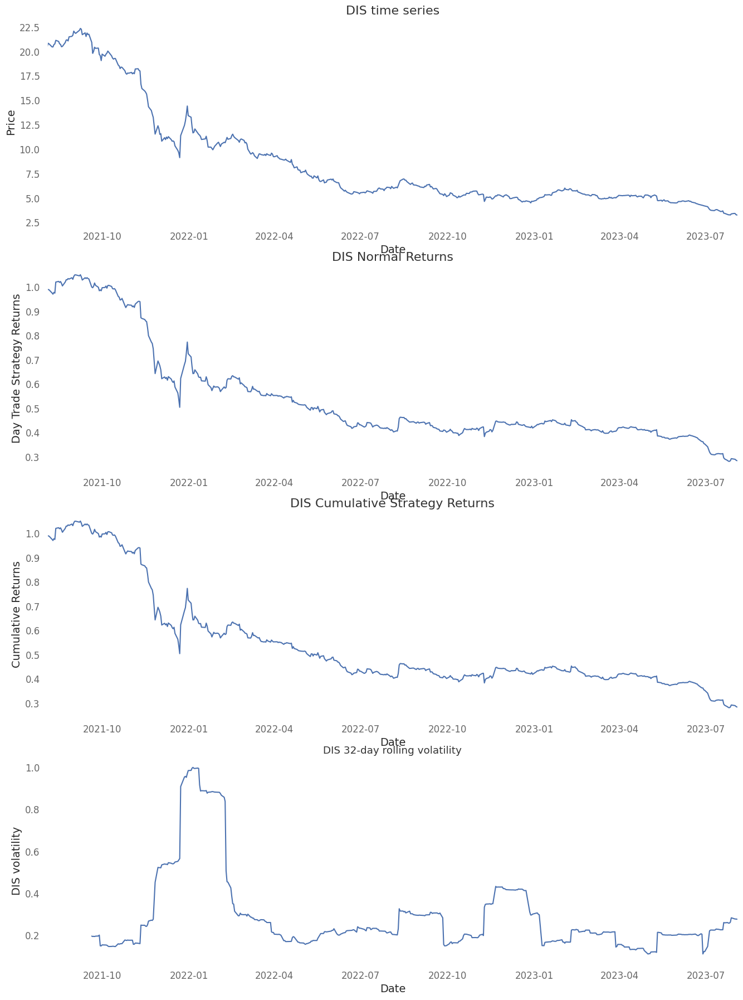

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,-46.8%
Cumulative returns,-71.6%
Annual volatility,34.2%
Sharpe ratio,-1.68
Calmar ratio,-0.64
Stability,0.81
Max drawdown,-73.2%


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


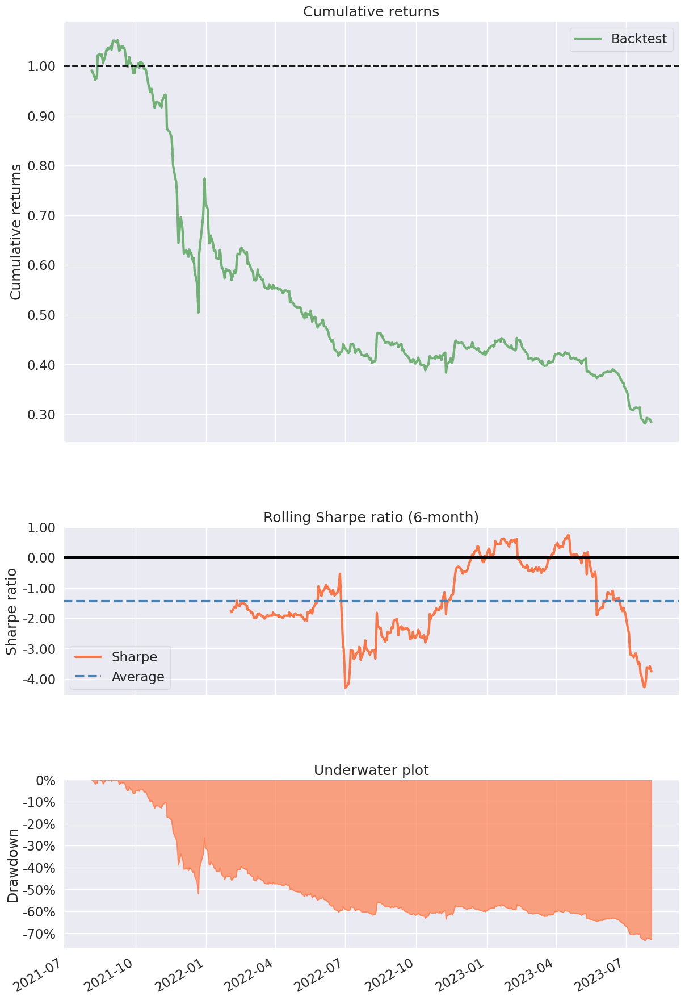

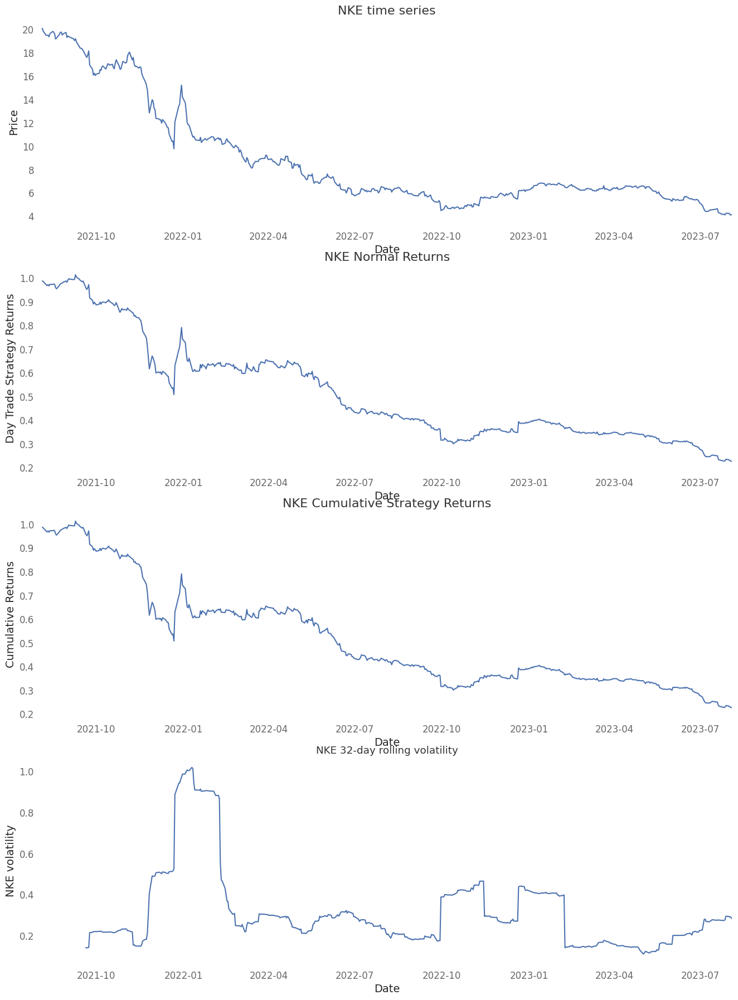

Start date,2021-08-05
End date,2023-08-03
Total months,23
,Backtest
Annual return,-52.5%
Cumulative returns,-77.3%
Annual volatility,36.1%
Sharpe ratio,-1.88
Calmar ratio,-0.68
Stability,0.91
Max drawdown,-77.6%


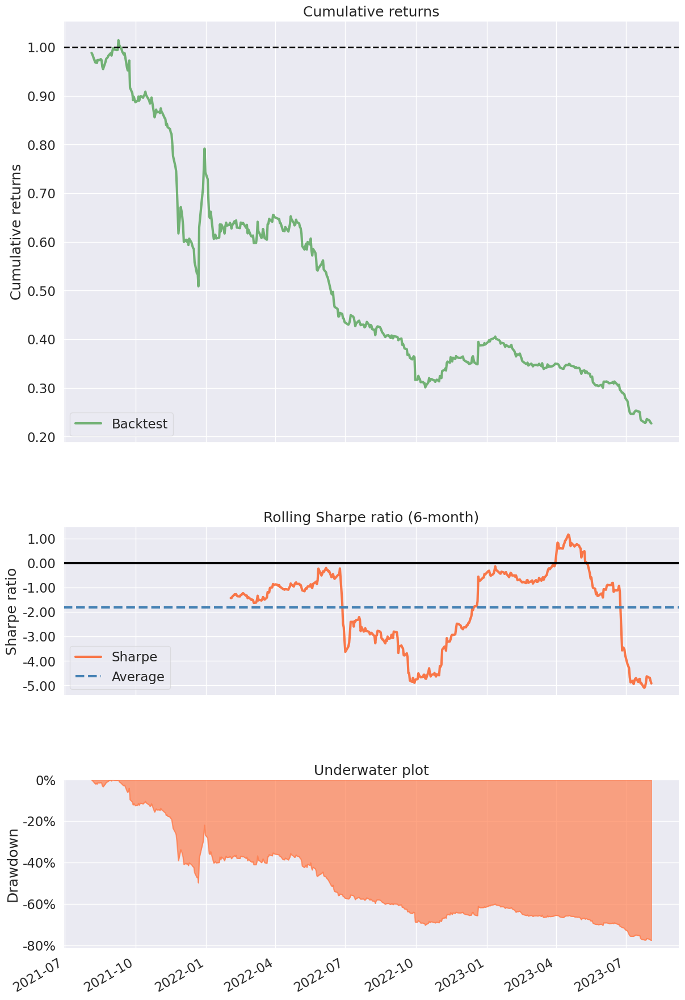

In [106]:
def main():

  bist_df = ShowTRMarket_v2(BIST30)
  for ticker in bist_df['Ticker']:
    ShowTickerStats( ticker,"BIST")

  dow_df = ShowUSMarket_v2(DOW30)
  for ticker in dow_df['Ticker']:
      ShowTickerStats( ticker,"US")

if __name__ == "__main__":
    main()

Start date: 2022-08-04
End date: 2023-08-05


,Backtest
,
Annual return,285.19%
Cumulative return,281.09%
Annual volatility,52.99 %
Winning day ratio,53.2%
Sharpe ratio,2.81
Calmar ratio,4.62
Information ratio,0.01
Stability,0.77
Max Drawdown,-33.03 %


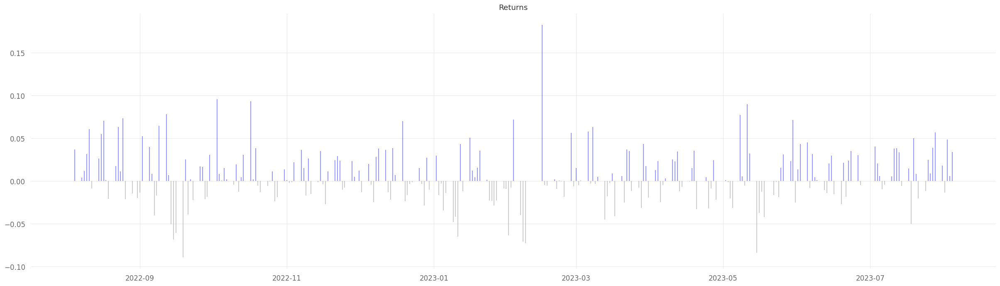

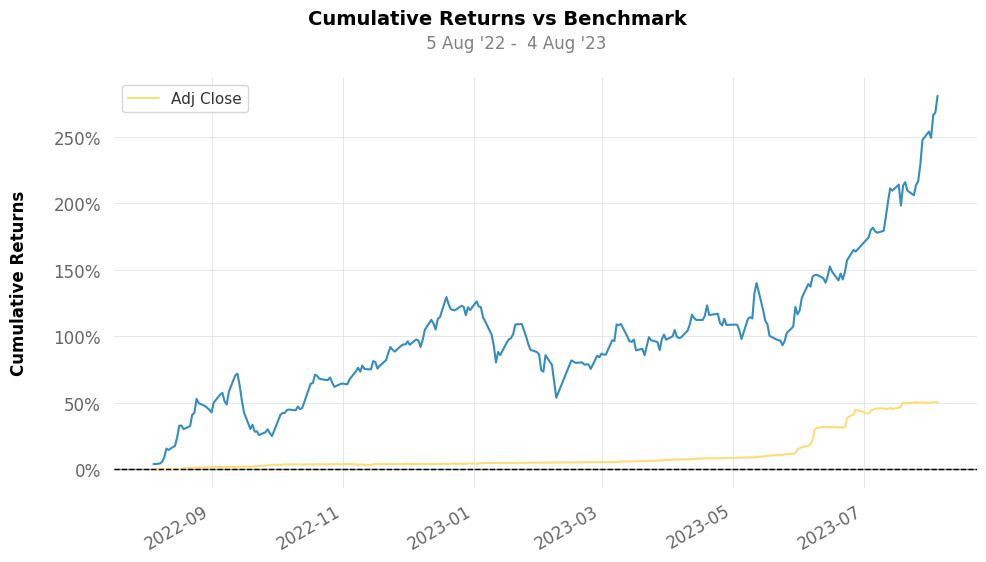

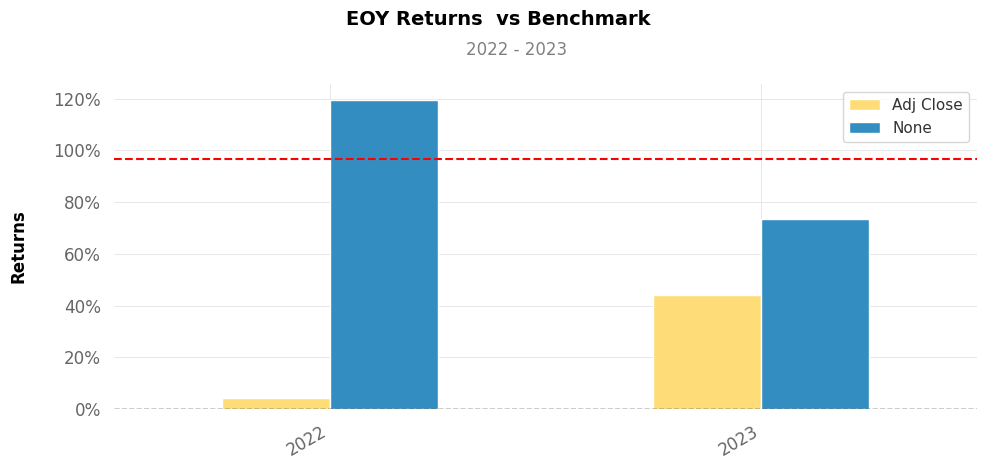

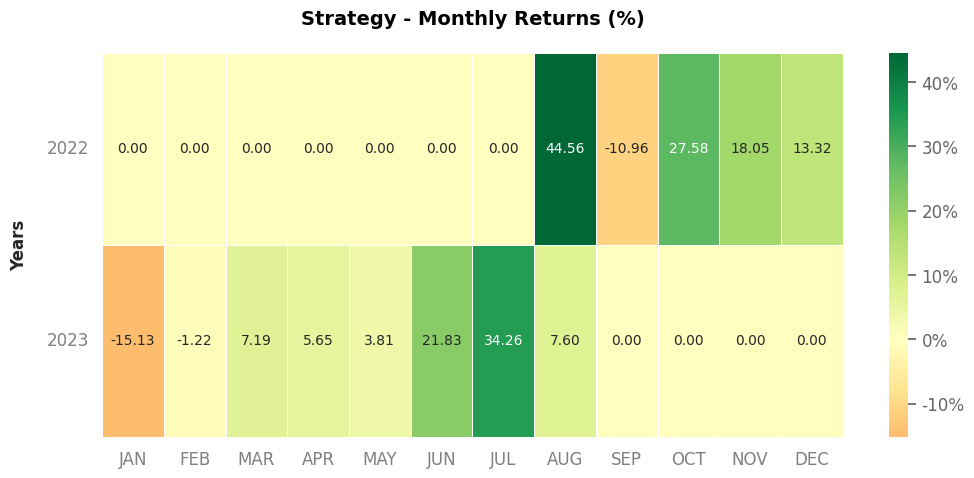

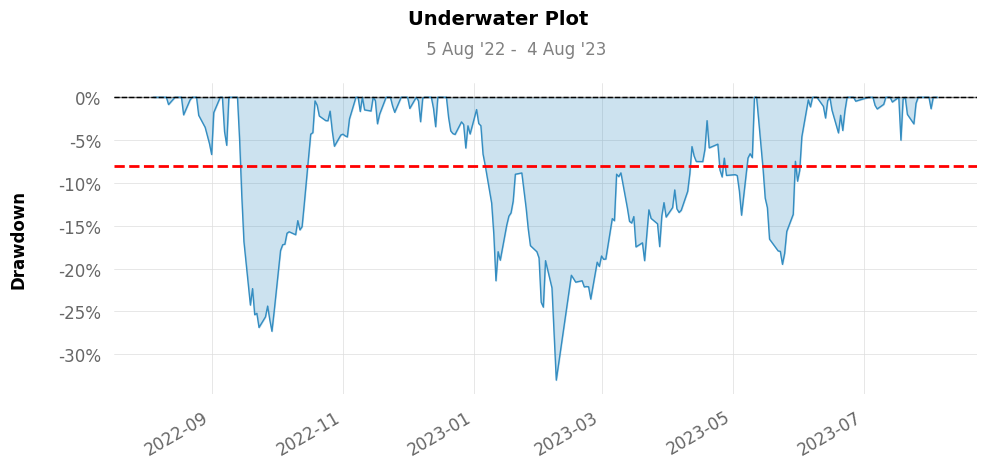

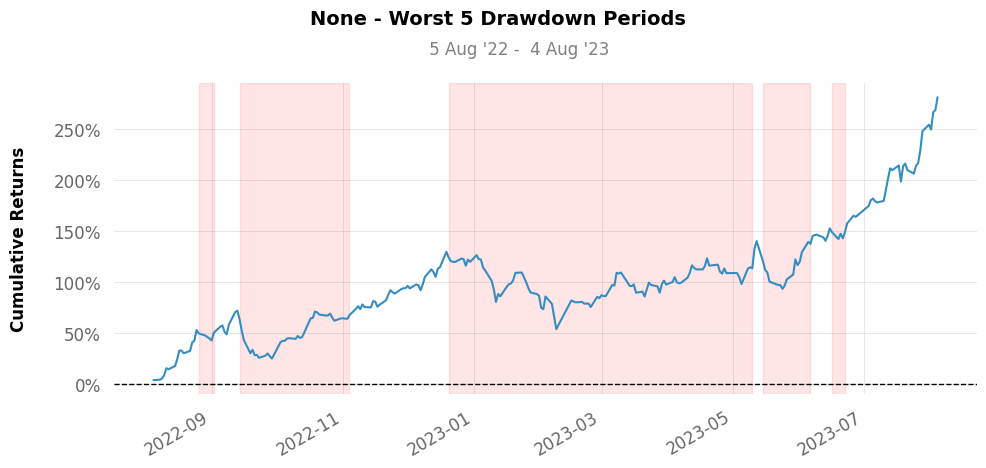

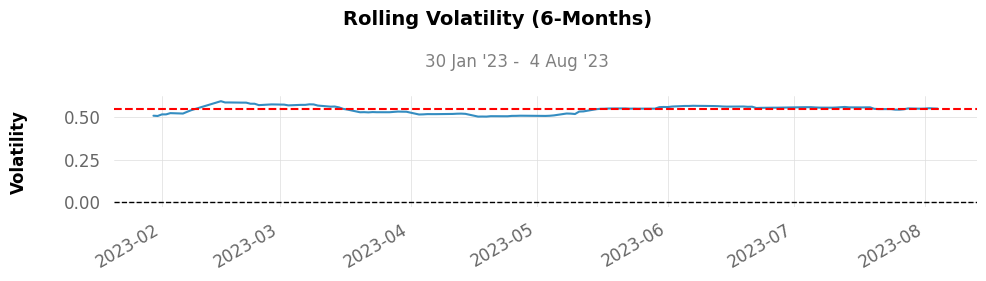

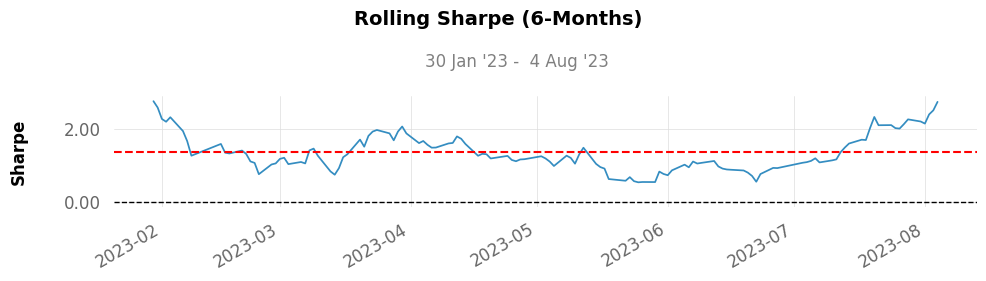

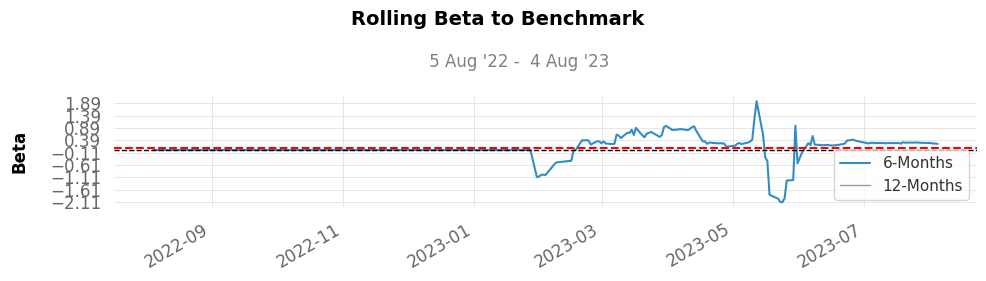

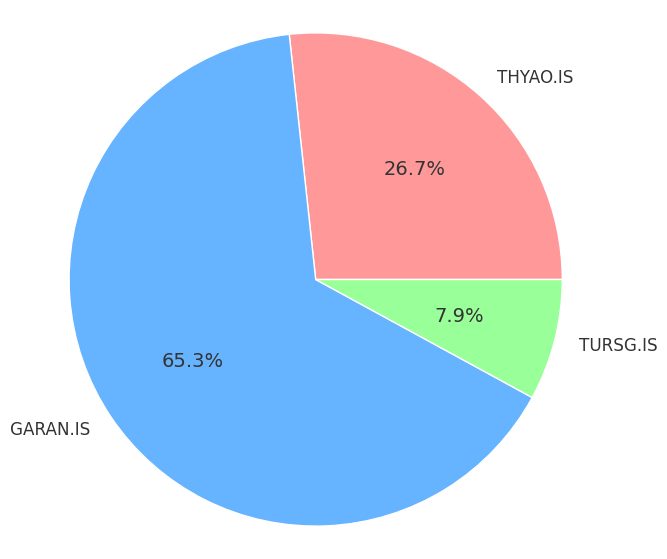

,0,1,2
Assets,THYAO.IS,GARAN.IS,TURSG.IS
Allocation,0.26712,0.65345,0.07943


In [107]:

!pip install Scikit-learn
!pip install empyrial

from empyrial import empyrial, Engine

pf2 = Engine(
                  start_date= "2022-08-04", #start date for the backtesting

                  #portfolio= [ "THYAO.IS", "EUPWR.IS"] #assets in your portfolio
                  portfolio= ["THYAO.IS", "GARAN.IS", "TURSG.IS"], #assets in your portfolio
                  optimizer = "MEANVAR", # defines Mean-Variance as the optimizer
                  max_vol = 150, #maximize the return for this level of volatility (25%)
                  benchmark = ["TRY=X"], #NIFTY50 is set by default
                  #rebalance = "1Y" #rebalance every year
                  #risk_manager = {"Take Profit" : 1} #Stop the investment when the profit becomes superior to 25%
)
empyrial(pf2)
empyrial.orderbook